<center><h1>QBUS2820 - Predictive Analytics</h1></center>

# Assignment 2:  Forecasting Google Trends keywords
<br>
<a class="buttom" href="#Setup">Setup</a> <br>
<a class="buttom" href="#Seasonal-Naive-Method">Seasonal Naive Method</a> <br>
<a class="buttom" href="#Simple-Exponential-Smoothing">Simple Exponential Smoothing</a> <br>
<a class="buttom" href="#Holts-linear-method">Holts linear method</a> <br>
<a class="buttom" href="#Holt-Winters-Method">Holt-Winters Method</a> <br>
<a class="buttom" href="#Exponential-Smoothing-Family">Exponential Smoothing Family</a> <br>
<a class="buttom" href="#Automatic-ARIMA-method">Automatic ARIMA method</a> <br>
<a class="buttom" href="#Results">Results</a> <br>

In [1]:
# import libraries

import warnings
warnings.filterwarnings("ignore")
import forecast
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.metrics import mean_absolute_error
import statsmodels.api as sm
import statsmodels.tsa.seasonal
from statsmodels.graphics.tsaplots import plot_acf
import pmdarima as pm

# Setup

The below code chunk defines three functions: get_freq, get_seasonal_period, and get_performance_display.

The get_freq function takes a DataFrame as an argument and returns the frequency of the DataFrame’s index inferred by the pd.infer_freq function.

The get_seasonal_period function takes a frequency string as an argument and returns the seasonal period based on the frequency. The function checks if the frequency is ‘H’, ‘W-SUN’, or ‘D’ and returns 24, 12, or 14 respectively.

The get_performance_display function takes a dictionary as an argument and returns a display of the dictionary’s contents in a DataFrame. The function creates a DataFrame from the dictionary with the keys as columns and the values as rows. The index of the DataFrame is set to [‘Expected Performance’, ‘Actual Performance’] and the DataFrame is displayed using the display function.

The code then reads data from a CSV file named ‘all_trends.csv’ into a DataFrame named data. The first column of the CSV file is used as the index of the DataFrame and is parsed as dates with the day first.

In [2]:
def get_freq(data):
    return pd.infer_freq(data.index)

def get_seasonal_period(freq):
    if freq == 'H':
        return 24
    elif freq == 'W-SUN':
        return 12
    elif freq == 'D':
        return 14

def get_performance_display(d):
    df = pd.DataFrame.from_dict(d, orient='index').T
    df.index = ['Expected Performance', 'Actual Performance']
    return display(df)

data = pd.read_csv('all_trends.csv', index_col='date', parse_dates=True, dayfirst=True)

# Seasonal Naive Method

The below code chunk defines several functions related to forecasting time series data using the random walk and seasonal naive methods.

The random_walk_forecast function takes a time series data and a seasonal_period as arguments and returns a forecast for the time series using the seasonal naive method. The function splits the data into training and test sets, with the test set being the last 10% of the data. The function then creates a DataFrame to store the forecast and iterates over the test set to generate forecast values based on the seasonal period. The forecast values are stored in the forecast DataFrame and returned along with the training and test data.

The random_walk_original_vs_forecast function takes several arguments including a time series y_random_walk, a forecast, training and test data, and a keyword. The function creates a plot that shows the original time series, the seasonal naive forecast, and a probabilistic forecast based on the 25-75% quantiles of the test data.

The random_walk_diagnostics function takes a time series y_random_walk as an argument and creates several diagnostic plots for the time series. The function calculates the residuals of the time series by subtracting a one-step shifted version of the time series from itself. The function then creates three plots: a residual plot that shows the residuals over time, an ACF plot that shows the autocorrelation of the residuals, and a distribution plot that shows the distribution of the residuals.

The random_walk_validation function takes a time series y_random_walk as an argument and returns a validation set that consists of all data up to the start of the last 10% of the data.

The random_walk_mae function takes test data and a test set as arguments and returns the mean absolute error (MAE) of a random walk forecast for the test set. The function iterates over the test set to generate random walk forecasts and calculates the MAE using the mean_absolute_error function from scikit-learn.

The seasonal_naive function takes a keyword and an optional performance dictionary as arguments. The function extracts a time series of hits for the given keyword from a global DataFrame named data. The frequency of the time series is inferred using the get_freq function defined earlier in this code. The seasonal period is then calculated using this frequency and passed to the random_walk_forecast function to generate a forecast for the time series. Several diagnostic plots are created using the random_walk_diagnostics and random_walk_original_vs_forecast functions. A validation set is created using the random_walk_validation function. If a performance dictionary is provided, it is updated with the MAE of both validation and test sets.

Finally, an empty performance dictionary named seasonal_naive_performance is created. The code then iterates over all unique keywords in the global DataFrame named data and calls the seasonal_naive function for each keyword to update this performance dictionary.

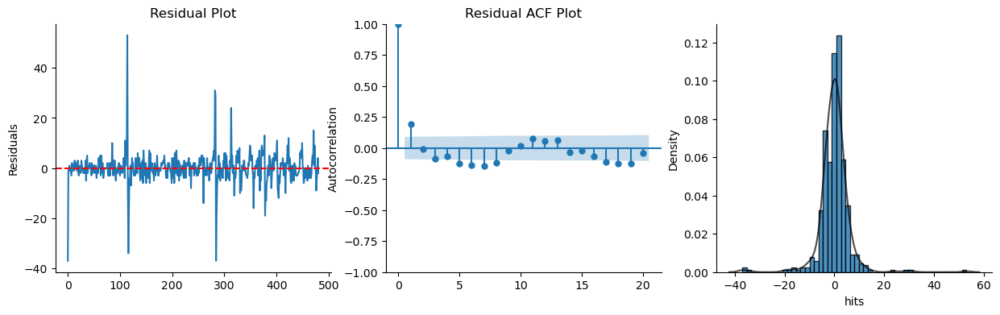

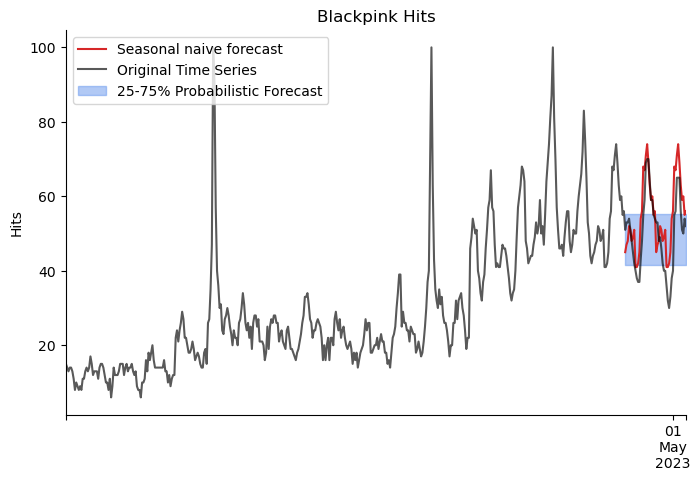

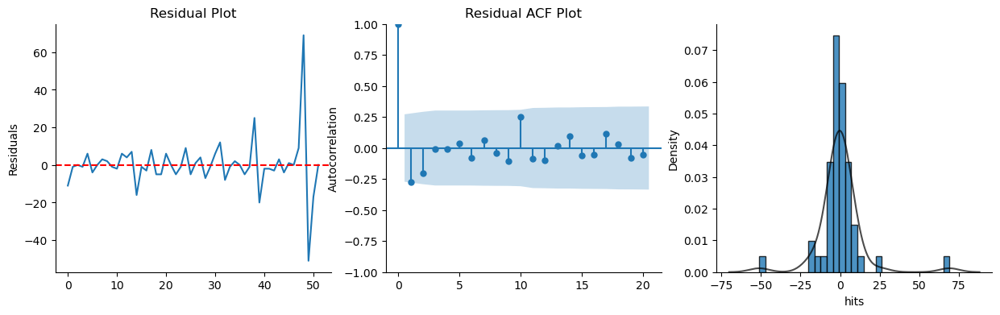

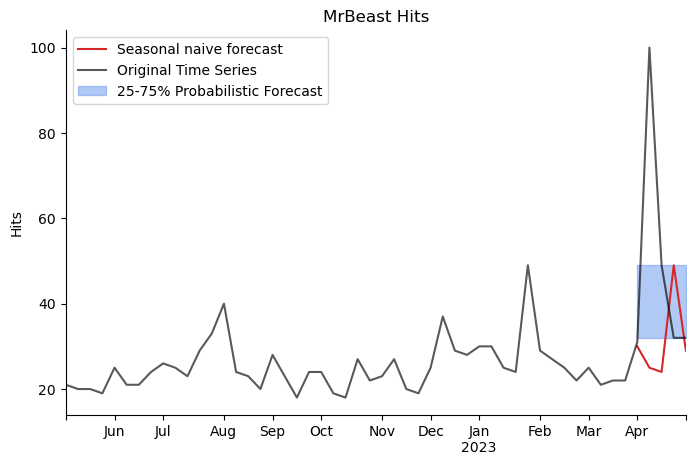

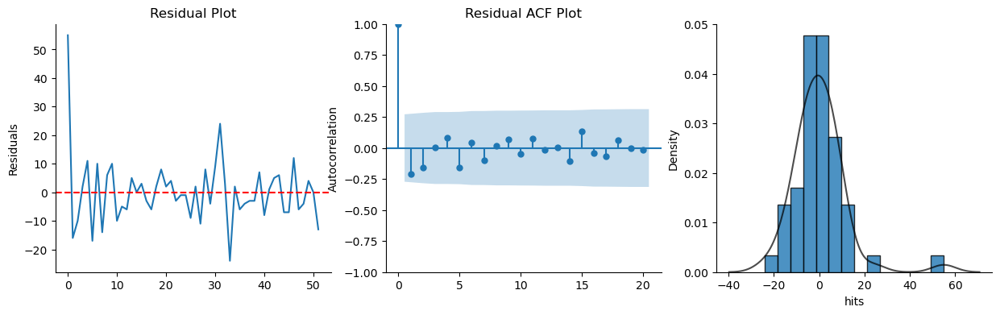

...

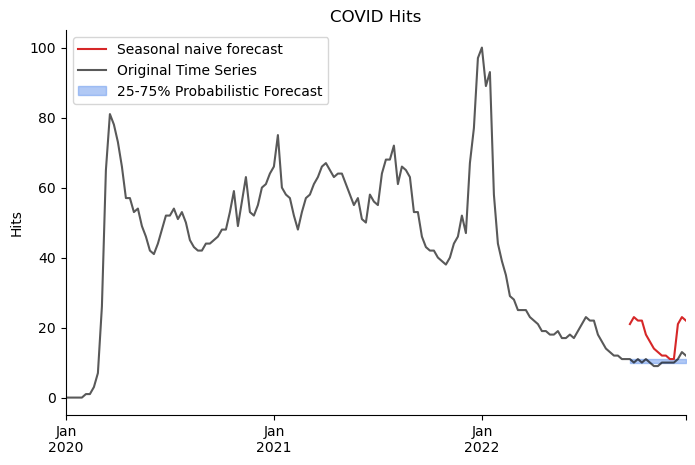

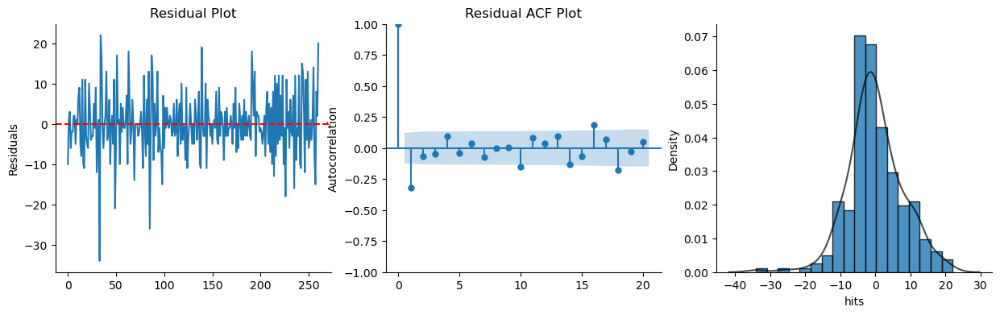

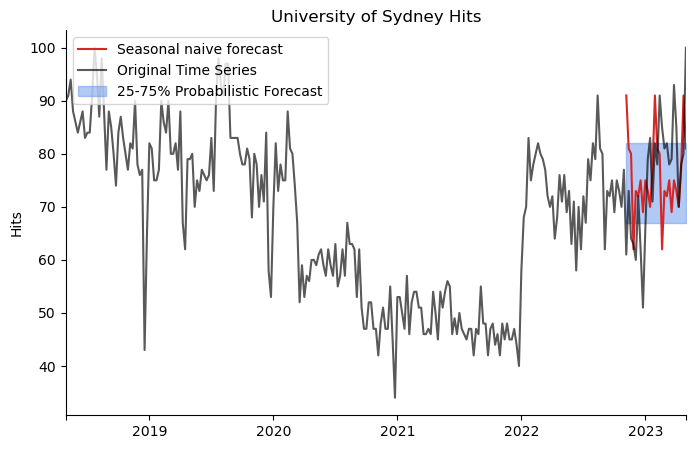

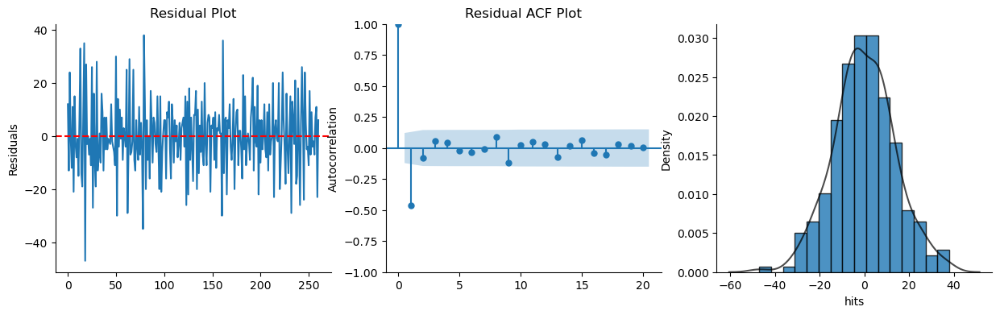

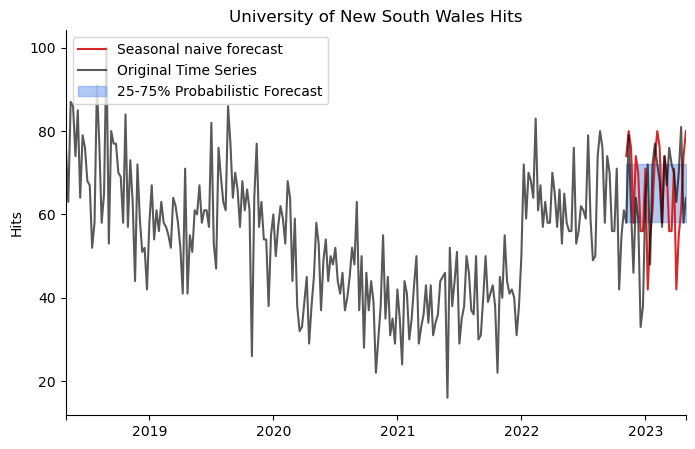

In [3]:
# seasonal naive
# random walk

def random_walk_forecast(data, seasonal_period):

    data_length = len(data)

    test_start_index = len(data) - len(data)//10
    test_data = data.iloc[test_start_index:]
    train_data = data.iloc[:test_start_index]

    forecast_steps = len(test_data)
    forecast = pd.DataFrame(index=test_data.index, columns=['Forecast'])

    forecast_values = []
    for i in range(forecast_steps):
        prev_season_index = (test_start_index - seasonal_period) + (i % seasonal_period)
        forecast_value = data.iloc[prev_season_index]
        forecast_values.append(forecast_value)

    forecast['Forecast'] = pd.Series(forecast_values, index=test_data.index)

    return forecast, train_data, test_data

def random_walk_original_vs_forecast(y_random_walk, forecast, train_data, test_data, keyword):
    
    fig, ax= plt.subplots(figsize=(8,5))
    forecast=pd.Series(forecast['Forecast'], index=y_random_walk.index)
    forecast.plot(color='#D62728', label='Seasonal naive forecast')
    y_random_walk.plot(color='black', label='Original Time Series', alpha=0.65)
    
    # Calculate the 75% and 25% quantiles
    upper = test_data.quantile(0.75)
    lower = test_data.quantile(0.25)
    
    # Plot the quantiles
    ax.fill_between(test_data.index, upper, lower, color='#6495ED', alpha=0.5, label='25-75% Probabilistic Forecast')
    
    plt.legend(loc='upper left')
    ax.set_xlabel('')
    ax.set_ylabel('Hits')
    ax.set_title(keyword + ' Hits')
    ax.set_xticks([], minor=True)
    sns.despine()
    plt.show()

def random_walk_diagnostics(y_random_walk):
    
    observed_values = pd.Series(y_random_walk)
    forecasted_values = y_random_walk.shift(1)
    forecasted_values.iloc[0] = y_random_walk.iloc[-1]
    residuals = observed_values - forecasted_values
    residuals.index = range(len(residuals))

    fig, axs = plt.subplots(1, 3, figsize=(15, 4))

    # Residual plot
    axs[0].plot(residuals)
    axs[0].axhline(0, color='red', linestyle='--')
    axs[0].set_ylabel('Residuals')
    axs[0].set_title('Residual Plot')

    # Residual ACF plot
    plot_acf(residuals, lags=20, ax=axs[1])
    axs[1].set_ylabel('Autocorrelation')
    axs[1].set_title('Residual ACF Plot')

    # Residual distribution plot
    sns.distplot(residuals, ax=axs[2], hist_kws={'alpha': 0.8, 'edgecolor':'black'},  
                 kde_kws={'color': 'black', 'alpha': 0.7})
    
    sns.despine()
    plt.show()

def random_walk_validation(y_random_walk):  
    
    test = y_random_walk.tail(len(y_random_walk)//10).index[0]
    validation=y_random_walk[:test]
    
    return validation

def random_walk_mae(test_data, test_set):
    
    random_walk_pred = []
    actual = []
    for i in range(0, len(test_set)):
        actual.append(test_data.iloc[i]) # actual value
        random_walk_pred.append(test_data.iloc[i-1]) # random walk forecast
    
    columns=['RW', 'Actual']
    results = np.vstack([random_walk_pred,actual]).T
    results = pd.DataFrame(results, columns=columns, index=test_set)
    mae = round(mean_absolute_error(results['Actual'], results['RW']), 4)
    return mae



def seasonal_naive(keyword, seasonal_naive_performance=None):
    
    y_random_walk = data[data['keyword'] == keyword]['hits'].copy()
    freq = get_freq(y_random_walk)
    y_random_walk.index = y_random_walk.index.to_period(freq=freq)
    seasonal_period = get_seasonal_period(freq)
    forecast_data, train_data, test_data = random_walk_forecast(y_random_walk, seasonal_period)
    random_walk_diagnostics(y_random_walk)
    random_walk_original_vs_forecast(y_random_walk, forecast_data, train_data, test_data, keyword)
    validation = random_walk_validation(y_random_walk)
    if seasonal_naive_performance is not None:
        seasonal_naive_performance[keyword] = [random_walk_mae(y_random_walk, validation), random_walk_mae(test_data, forecast_data['Forecast'])]

seasonal_naive_performance = {}
for keyword in data['keyword'].unique():
    seasonal_naive(keyword, seasonal_naive_performance)

# Simple Exponential Smoothing

The below code chunk defines several functions related to forecasting time series data using the simple exponential smoothing (SES) method.

The ses_summary function takes a time series y as an argument and returns a fitted SES model and the smoothed values of the time series. The function creates an SES model using the ses function from the forecast library and fits it to the data. The smoothed values of the time series are calculated using the smooth method of the fitted model and returned along with the model.

The original_vs_ses function takes several arguments including a time series y, a fitted SES model, and a keyword. The function creates a plot that shows the original time series and the forecast generated by the fitted SES model.

The ses_diagnostics function takes a time series y and a fitted SES model as arguments and creates several diagnostic plots for the time series. The function calculates the residuals of the time series by subtracting the fitted values from the original values. The function then creates three plots: a residual plot that shows the residuals over time, an ACF plot that shows the autocorrelation of the residuals, and a distribution plot that shows the distribution of the residuals.

The ses_validation function takes a time series y as an argument and returns a validation set and test set. The validation set consists of all data up to the start of the last 10% of the data, while the test set consists of the last 10% of the data.

The ses_mae function takes test data and a test set as arguments and returns the mean absolute error (MAE) of an SES forecast for the test set. The function iterates over the test set to generate SES forecasts using a rolling window approach. The MAE is then calculated using these forecasts and the actual values in the test set.

The ses_forecast function takes several arguments including a forecast horizon h, an SES model, a time series y, its frequency freq, and an axis object ax. The function generates an SES forecast for the given horizon using the provided model and plots it on the provided axis object along with probabilistic forecasts based on different confidence levels.

The ses function takes a keyword and an optional performance dictionary as arguments. The function extracts a time series of hits for the given keyword from a global DataFrame named data. The frequency of this time series is inferred using the get_freq function defined earlier in this code. An SES model is then created and fitted to this time series using the ses_summary function. Several diagnostic plots are created using the ses_diagnostics and original_vs_ses functions. A validation set is created using the ses_validation function. If a performance dictionary is provided, it is updated with the MAE of both validation and test sets.

In [4]:
def ses_summary(y):
    
    ses=forecast.ses(y)
    ses.fit()
    fitted=pd.Series(ses.smooth(), index=y.index)
    return ses, fitted

def original_vs_ses(y, fitted, keyword):
    fig, ax = plt.subplots(figsize=(10,5))
    y.plot(label='Original time series', color='#023020', ax=ax, alpha=0.65)
#     fitted.plot(color='red', label='Simple exponential smoothing fit', alpha=0.8, ax=ax)
    fitted[-len(fitted)//10:].plot(color='red', label='SES forecast fit', ax=ax)
    ax.set_xlabel('')
    ax.set_ylabel('Hits')
    ax.set_title(keyword + ' Hits (SES)')
    ax.set_xticks([], minor=True) 
    ax.legend(loc='upper left')
    return ax

def ses_diagnostics(y, fitted):

    resid=y-fitted
    resid.index = range(len(resid))
    fig, axs = plt.subplots(1, 3, figsize=(15, 4))

    # residual
    axs[0].plot(resid)
    axs[0].axhline(0, color='red', linestyle='--')
    axs[0].set_xlabel('')
    axs[0].set_xticks([], minor=True) 
    axs[0].set_title('Residual plot')

    # autocorrection
    sm.graphics.tsa.plot_acf(resid, lags=40, ax=axs[1])

    # distribution
    sns.distplot(resid, ax=axs[2], hist_kws={'alpha': 0.8, 'edgecolor':'black'},  
                     kde_kws={'color': 'black', 'alpha': 0.7})

    sns.despine()
    plt.show()

def ses_validation(y):  
    
    train = y.tail(len(y)//10).index[0]
    validation=y[:train]
    test = y[train:]
    
    return validation, test

def ses_mae(test_data, test_set):
    
    ses_pred = []
    actual = []
    
    for i in range(0, len(test_set)):
        actual.append(test_data.iloc[i]) # actual value
        
        model = forecast.ses(test_data.iloc[:i+1]) 
        model.fit()
        ses_pred.append(model.forecast(1)[0]) # SES forecast
    
    columns=['SES', 'Actual']
    results = np.vstack([ses_pred,actual]).T
    results = pd.DataFrame(results, columns=columns, index=test_set)
    mae = round(mean_absolute_error(results['Actual'], results['SES']), 4)
    
    return mae

def ses_forecast(h, ses, y, freq, ax):
    
    model = ses
    test = y.tail(len(y)//10).index
    pred = pd.Series(model.forecast(h), index=test)
    intv1 = pd.DataFrame(model.intervalforecast(h, level=.25), index=test)
    intv2 = pd.DataFrame(model.intervalforecast(h, level=.75), index=test)
    intv3 = pd.DataFrame(model.intervalforecast(h, level=1), index=test)
    
    last=y.iloc[-1:]
    extended=last.append(pred)

    extended.plot(color='black', alpha=0.4, ax=ax)
    ax.fill_between(extended.index, last.append(intv2.iloc[:,0]), last.append(intv2.iloc[:,1]), facecolor='#ADD8E6', lw=0, label='25% probabilistic forecast')
    ax.fill_between(extended.index, last.append(intv1.iloc[:,0]), last.append(intv1.iloc[:,1]), facecolor='#6495ED', lw=0, label='75% probabilistic forecast')
    hold = ax.get_ylim()
    ax.set_ylim(hold)
    ax.legend(loc='upper left')
    ax.set_xticks([], minor=True)
    ax.set_xlabel('')

def ses(keyword, ses_performance=None):

    y = data[data['keyword'] == keyword]['hits'].copy()
    freq = get_freq(y)
    y.index = y.index.to_period(freq=freq)
    ses, fitted = ses_summary(y)
    ses_diagnostics(y, fitted)
    validation, test = ses_validation(y)
    ax = original_vs_ses(y, fitted, keyword)
    ses_forecast(len(test), ses, y, freq, ax)
    plt.show()
    if ses_performance is not None:
        ses_performance[keyword] = [ses_mae(y, validation), ses_mae(y, test)]

# Holts linear method

The below code chunk defines several functions related to forecasting time series data using the Holt’s linear method.

The get_decomposition function takes a time series ts, a seasonal period h, and a keyword as arguments and creates two plots that show the trend and seasonal components of the time series. The function uses the seasonal_decompose function from the statsmodels.tsa.seasonal module to decompose the time series into its trend and seasonal components. These components are then plotted using the plot method of the Pandas Series object.

The holt_summary function takes a time series ts and another time series y as arguments and returns a fitted Holt’s linear model and the smoothed values of the time series. The function creates a Holt’s linear model using the holt function from the forecast library and fits it to the data. The smoothed values of the time series are calculated using the smooth method of the fitted model and returned along with the model.

The original_vs_holt function takes several arguments including a time series ts, a fitted Holt’s linear model, and a keyword. The function creates a plot that shows the original time series and the forecast generated by the fitted Holt’s linear model.

The holt_diagnostics function takes a time series y and a fitted Holt’s linear model as arguments and creates several diagnostic plots for the time series. The function calculates the residuals of the time series by subtracting the fitted values from the original values. The function then creates three plots: a residual plot that shows the residuals over time, an ACF plot that shows the autocorrelation of the residuals, and a distribution plot that shows the distribution of the residuals.

The holt_validation function takes a time series y as an argument and returns a validation set and test set. The validation set consists of all data up to the start of the last 10% of the data, while the test set consists of the last 10% of the data.

The holt_mae function takes test data and a test set as arguments and returns the mean absolute error (MAE) of a Holt’s linear forecast for the test set. The function iterates over the test set to generate Holt’s linear forecasts using a rolling window approach. The MAE is then calculated using these forecasts and the actual values in the test set.

The holt_forecast function takes several arguments including a forecast horizon h, a Holt’s linear model, a time series y, its frequency freq, and an axis object ax. The function generates a Holt’s linear forecast for the given horizon using the provided model and plots it on the provided axis object along with probabilistic forecasts based on different confidence levels.

The holt function takes a keyword and an optional performance dictionary as arguments. The function extracts two time series of hits for the given keyword from a global DataFrame named data. One of these time series is converted to have its index as periods using its frequency inferred by calling previously defined functions. A trend and seasonal decomposition is performed on one of these time series using previously defined functions. A Holt’s linear model is then created and fitted to one of these time series using previously defined functions. Several diagnostic plots are created using previously defined functions. A validation set is created using previously defined functions. If a performance dictionary is provided, it is updated with MAE values calculated by calling previously defined functions.

In [5]:
def get_decomposition(ts, h, keyword):
    window_size = 12
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
    decomposition = statsmodels.tsa.seasonal.seasonal_decompose(ts, filt=np.repeat(1/window_size, window_size), period=h)
    decomposition.trend.plot(ax=ax1)
    ax1.set_title('Trend' + ' (' + keyword + ')')
    ax1.set_xticks([], minor=True)
    decomposition.seasonal.plot(ax=ax2)
    ax2.set_title('Seasonal' + ' (' + keyword + ')')
    ax2.set_xticks([], minor=True)
    plt.tight_layout()
    plt.show()

def holt_summary(ts, y):
    holt = forecast.holt(ts)
    holt.fit()
    smoothed=pd.Series(holt.smooth(), index=y.index)
    
    return holt, smoothed

def original_vs_holt(ts, smoothed, keyword):
    fig, ax= plt.subplots(figsize=(10,6))
    smoothed[-len(ts)//10:].plot(color='#D62728', label='Holt forecast fit')
    ts.plot(color='#023020', label='Original time series', alpha=0.65)
    plt.legend(loc='best')
    ax.set_xlabel('')
    ax.set_xticks([], minor=True)
    ax.set_title(keyword + ' Hits (Holt)')
    sns.despine()
    return ax

def holt_diagnostics(y, fitted):

    resid=y-fitted
    resid.index = range(len(resid))
    fig, axs = plt.subplots(1, 3, figsize=(15, 4))

    # residual
    axs[0].plot(resid)
    axs[0].axhline(0, color='red', linestyle='--')
    axs[0].set_xlabel('')
    axs[0].set_xticks([], minor=True) 
    axs[0].set_title('Residual plot')

    # autocorrection
    sm.graphics.tsa.plot_acf(resid, lags=40, ax=axs[1])

    # distribution
    sns.distplot(resid, ax=axs[2], hist_kws={'alpha': 0.8, 'edgecolor':'black'},  
                     kde_kws={'color': 'black', 'alpha': 0.7})

    sns.despine()
    plt.show()

def holt_validation(y):  
    
    train = y.tail(len(y)//10).index[0]
    validation=y[:train]
    test = y[train:]
    
    return validation, test

def holt_mae(test_data, test_set):
    
    holt_pred = []
    actual = []
    
    for i in range(0, len(test_set)):
        actual.append(test_data.iloc[i]) # actual value
        
        model = forecast.holt(test_data.iloc[:i+1]) 
        model.fit()
        holt_pred.append(model.forecast(1)[0]) # SES forecast
    
    columns=['Holt', 'Actual']
    results = np.vstack([holt_pred,actual]).T
    results = pd.DataFrame(results, columns=columns, index=test_set)
    mae = round(mean_absolute_error(results['Actual'], results['Holt']), 4)
    
    return mae
    
def holt_forecast(h, holt, y, freq, ax):
    
    model = holt
    test = y.tail(len(y)//10).index
    pred = pd.Series(model.forecast(h), index=test)
    intv1 = pd.DataFrame(model.intervalforecast(h, level=.25), index=test)
    intv2 = pd.DataFrame(model.intervalforecast(h, level=.75), index=test)
    intv3 = pd.DataFrame(model.intervalforecast(h, level=1), index=test)
    
    last=y.iloc[-1:]
    extended=last.append(pred)

    extended.plot(color='black', alpha=0.4, ax=ax)
    ax.fill_between(extended.index, last.append(intv2.iloc[:,0]), last.append(intv2.iloc[:,1]), facecolor='#ADD8E6', lw=0, label='25% probabilistic forecast')
    ax.fill_between(extended.index, last.append(intv1.iloc[:,0]), last.append(intv1.iloc[:,1]), facecolor='#6495ED', lw=0, label='75% probabilistic forecast')
    hold = ax.get_ylim()
    ax.set_ylim(hold)
    ax.legend(loc='upper left')
    ax.set_xticks([], minor=True)
    ax.set_xlabel('')

def holt(keyword, holt_performance=None):
    
    y = data[data['keyword'] == keyword]['hits'].copy()
    freq = get_freq(y)
    h = get_seasonal_period(freq)
    y.index = y.index.to_period(freq=freq)
    ts = data[data['keyword'] == keyword]['hits']
    get_decomposition(ts, h, keyword)
    holt, smoothed = holt_summary(ts, y)
    holt_diagnostics(y, smoothed)
    ax = original_vs_holt(ts, smoothed, keyword)
    holt_forecast(len(ts)//10, holt, y, freq, ax)
    plt.show()
    validation, test = holt_validation(y)
    if holt_performance is not None:
        holt_performance[keyword] = [holt_mae(y, validation), holt_mae(y, test)]

# Holt-Winters Method

This below code chunk defines several functions related to forecasting time series data using the Holt-Winters method.

The get_models function takes a time series y and a seasonal period h as arguments and returns a list of four fitted Holt-Winters models. The function creates four different Holt-Winters models using the holtwinters function from the forecast library with different combinations of additive/damped and log-transformed/non-log-transformed data. These models are then fitted to the data and returned in a list.

The holtwinters_validation function takes a time series y as an argument and returns a validation set and test set. The validation set consists of all data up to the start of the last 10% of the data, while the test set consists of the last 10% of the data.

The holtwinters_best_model function takes test data, a test set, and a list of models as arguments and returns the best model based on its mean absolute error (MAE) on the test set. The function iterates over the provided models and generates forecasts for each model using the forecast method. The MAE is then calculated for each model using these forecasts and the actual values in the test set. The model with the lowest MAE is returned as the best model.

The holtwinters_mae function takes test data, a test set, and a best model as arguments and returns the mean absolute error (MAE) of the provided model on the test set. The function generates forecasts for the provided model using its forecast method. The MAE is then calculated using these forecasts and the actual values in the test set.

The original_vs_holtwinters function takes several arguments including a time series ts, smoothed values from a fitted Holt-Winters model, and a keyword. The function creates a plot that shows the original time series and the forecast generated by the fitted Holt-Winters model.

The holtwinters_forecast function takes several arguments including a forecast horizon h, a Holt-Winters model, a time series y, its frequency freq, and an axis object ax. The function generates a Holt-Winters forecast for the given horizon using the provided model and plots it on the provided axis object along with probabilistic forecasts based on different confidence levels.

The holtwinters function takes a keyword and an optional performance dictionary as arguments. The function extracts two time series of hits for the given keyword from a global DataFrame named data. One of these time series is converted to have its index as periods using its frequency inferred by calling previously defined functions. A list of four Holt-Winters models is created by calling previously defined functions. A validation set is created by calling previously defined functions. The best model among these four models is determined by calling previously defined functions. A plot is created by calling previously defined functions. A forecast is plotted by calling previously defined functions. If a performance dictionary is provided, it is updated with MAE values calculated by calling previously defined functions.

In [6]:
def get_models(y, h):
    
    ahw=forecast.holtwinters(y, additive=True, damped=False, m=h)
    ahw.fit()
    
    ahw_damped=forecast.holtwinters(y, additive=True, damped=True, m=h)
    ahw_damped.fit()
    
    ahw_log=forecast.holtwinters(np.log(y), additive=True, damped=False, m=h)
    ahw_log.fit()
    
    ahw_log_damped=forecast.holtwinters(np.log(y), additive=True, damped=True, m=h)
    ahw_log_damped.fit()
    
    return [ahw, ahw_damped, ahw_log, ahw_log_damped]

def holtwinters_validation(y):
    
    train = y.tail(len(y)//10).index[0]
    validation=y[:train]
    test = y[train:]
    
    return validation, test

def holtwinters_best_model(test_data, test_set, models):
    best_mae = float('inf')
    best_model = None
    
    for model in models:
        holt_pred = []
        actual = []
        
        for i in range(0, len(test_set)):
            actual.append(test_data.iloc[i]) # actual value
            holt_pred.append(model.forecast(1)[0]) # holtwinters forecast

        columns=['Holtwinters', 'Actual']
        results = np.vstack([holt_pred,actual]).T
        results = pd.DataFrame(results, columns=columns, index=test_set)
        try:
            mae = round(mean_absolute_error(results['Actual'], results['Holtwinters']), 4)
        except (ValueError, ZeroDivisionError):
            mae = 99999
        
        if mae < best_mae:
            best_mae = mae
            best_model = model
    
    return best_model

def holtwinters_mae(test_data, test_set, best_model):
    
    holt_pred = []
    actual = []
    
    for i in range(0, len(test_set)):
        actual.append(test_data.iloc[i]) # actual value
        holt_pred.append(best_model.forecast(1)[0]) # holtwinters forecast
    
    columns=['Holtwinters', 'Actual']
    results = np.vstack([holt_pred,actual]).T
    results = pd.DataFrame(results, columns=columns, index=test_set)
    mae = round(mean_absolute_error(results['Actual'], results['Holtwinters']), 4)
    
    return mae

def original_vs_holtwinters(ts, smoothed, keyword):
    fig, ax= plt.subplots(figsize=(10,6))
    smoothed[-len(ts)//10:].plot(color='#D62728', label='Holtwinters forecast fit')
    ts.plot(color='#023020', label='Original time series', alpha=0.65)
    plt.legend(loc='best')
    ax.set_xlabel('')
    ax.set_xticks([], minor=True)
    ax.set_title(keyword + ' Hits (Holtwinters)')
    sns.despine()
    return ax

def holtwinters_forecast(h, model, y, freq, ax):
    
    model = model
    test = y.tail(len(y)//10).index
    pred = pd.Series(model.forecast(h), index=test)
    intv1 = pd.DataFrame(model.intervalforecast(h, level=.25), index=test)
    intv2 = pd.DataFrame(model.intervalforecast(h, level=.75), index=test)
    intv3 = pd.DataFrame(model.intervalforecast(h, level=1), index=test)
    
    last=y.iloc[-1:]
    extended=last.append(pred)

    extended.plot(color='black', alpha=0.4, ax=ax)
    ax.fill_between(extended.index, last.append(intv2.iloc[:,0]), last.append(intv2.iloc[:,1]), facecolor='#ADD8E6', lw=0, label='25% probabilistic forecast')
    ax.fill_between(extended.index, last.append(intv1.iloc[:,0]), last.append(intv1.iloc[:,1]), facecolor='#6495ED', lw=0, label='75% probabilistic forecast')
    hold = ax.get_ylim()
    ax.set_ylim(hold)
    ax.legend(loc='upper left')
    ax.set_xticks([], minor=True)
    ax.set_xlabel('')


def holtwinters(keyword, holtwinters_performance=None):
    y = data[data['keyword'] == keyword]['hits'].copy()
    freq = get_freq(y)
    h = get_seasonal_period(freq)
    y.index = y.index.to_period(freq=freq)
    ts = data[data['keyword'] == keyword]['hits'].copy()

    models = get_models(y, h)
    validation, test = holtwinters_validation(y)
    best_model = holtwinters_best_model(y, validation, models)
    ax = original_vs_holtwinters(ts, pd.Series(best_model.smooth(), index=y.index), keyword)
    holtwinters_forecast(len(ts)//10, best_model, y, freq, ax)
    plt.show()
    if holtwinters_performance is not None:
        holtwinters_performance[keyword] = [holtwinters_mae(y, validation, best_model), holtwinters_mae(y, test, best_model)]


# Exponential Smoothing Family

This below code chunk defines a function named exponential_smoothing that takes a keyword and three optional performance dictionaries as arguments. The function performs time series forecasting using three different exponential smoothing methods: simple exponential smoothing (SES), Holt’s linear method, and the Holt-Winters method.

The function extracts two time series of hits for the given keyword from a global DataFrame named data. One of these time series is converted to have its index as periods using its frequency inferred by calling previously defined functions. The seasonal period is calculated by calling previously defined functions.

The function then performs SES forecasting on one of these time series by calling previously defined functions. Several diagnostic plots are created by calling previously defined functions. A trend and seasonal decomposition is performed on one of these time series by calling previously defined functions. A validation set is created by calling previously defined functions. A plot is created by calling previously defined functions. A forecast is plotted by calling previously defined functions. If an SES performance dictionary is provided, it is updated with MAE values calculated by calling previously defined functions.

The function then performs Holt’s linear forecasting on one of these time series by calling previously defined functions. A plot is created by calling previously defined functions. A forecast is plotted by calling previously defined functions. A validation set is created by calling previously defined functions. If a Holt’s linear performance dictionary is provided, it is updated with MAE values calculated by calling previously defined functions.

The function then performs Holt-Winters forecasting on one of these time series by calling previously defined functions. A list of four Holt-Winters models is created by calling previously defined functions. A validation set is created by calling previously defined functions. The best model among these four models is determined by calling previously defined functions. A plot is created by calling previously defined functions. A forecast is plotted by calling previously defined functions. If a Holt-Winters performance dictionary is provided, it is updated with MAE values calculated by calling previously defined functions.

Finally, three empty performance dictionaries are created for SES, Holt’s linear, and Holt-Winters methods respectively. The code then iterates over all unique keywords in the global DataFrame named data and calls the exponential_smoothing function for each keyword to update these performance dictionaries.

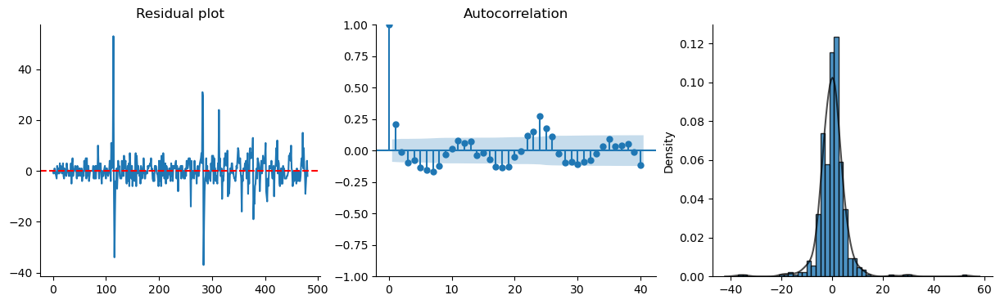

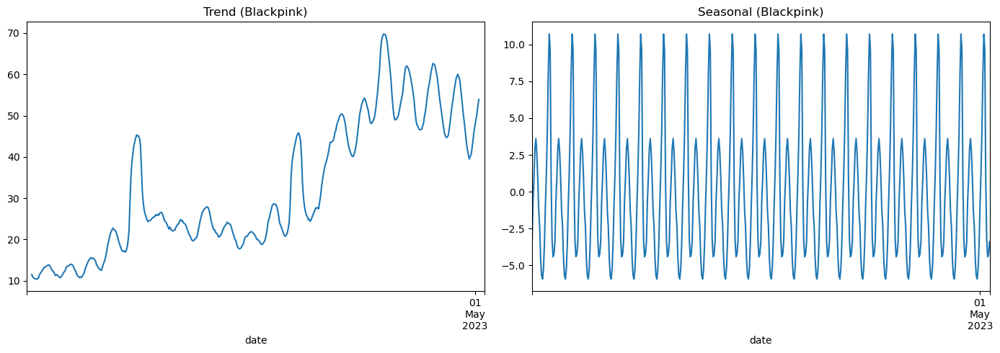

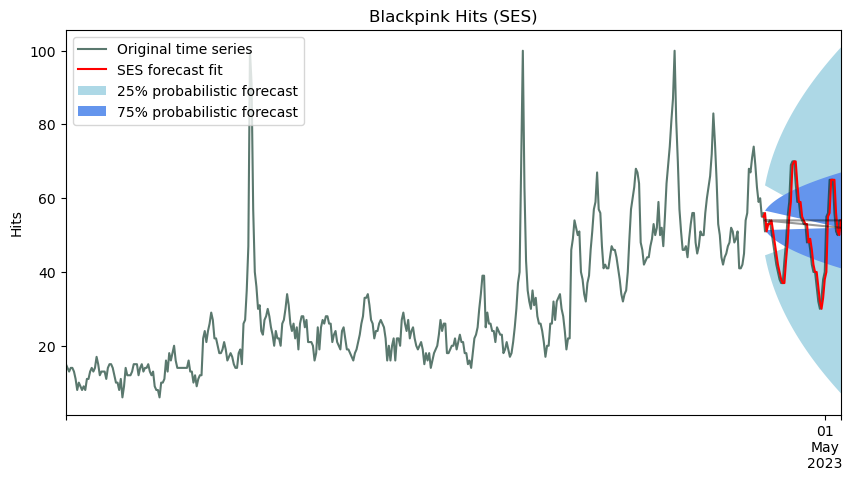

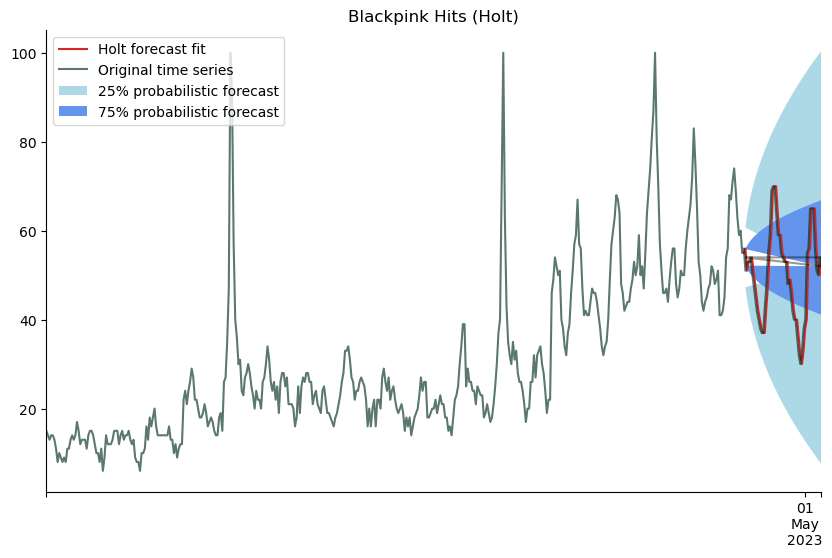

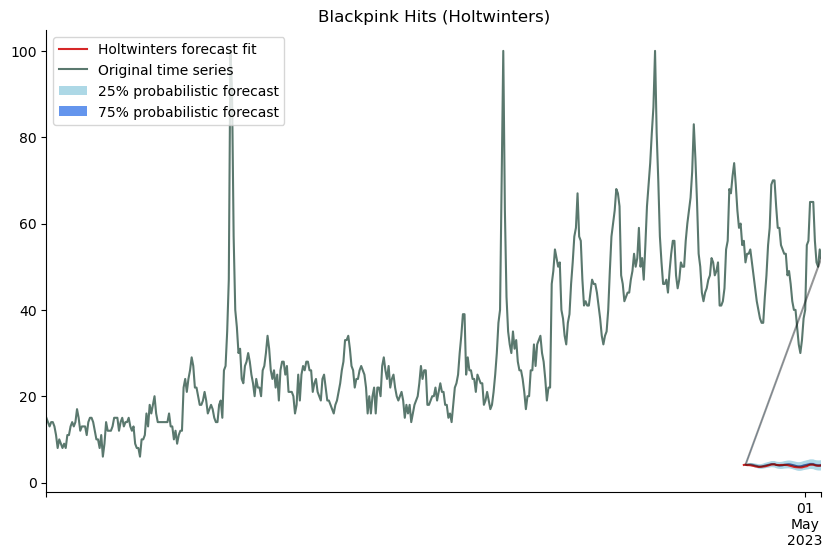

...

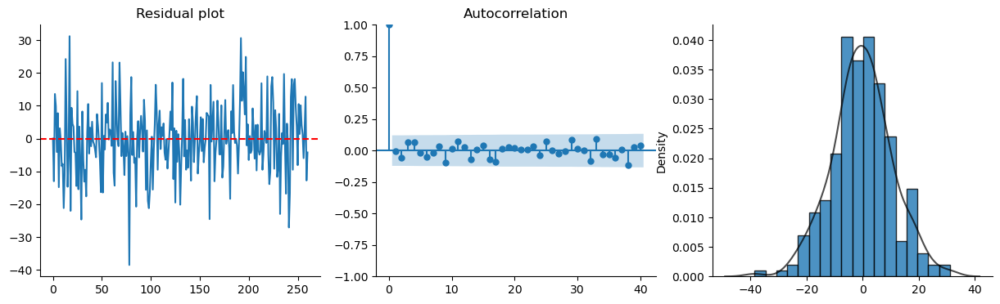

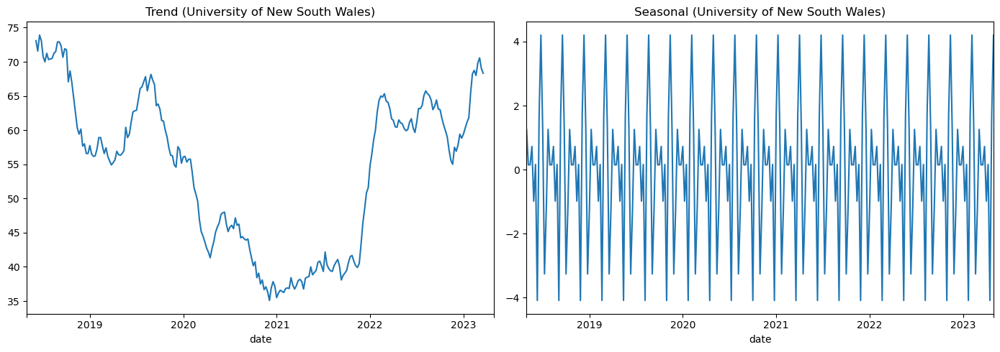

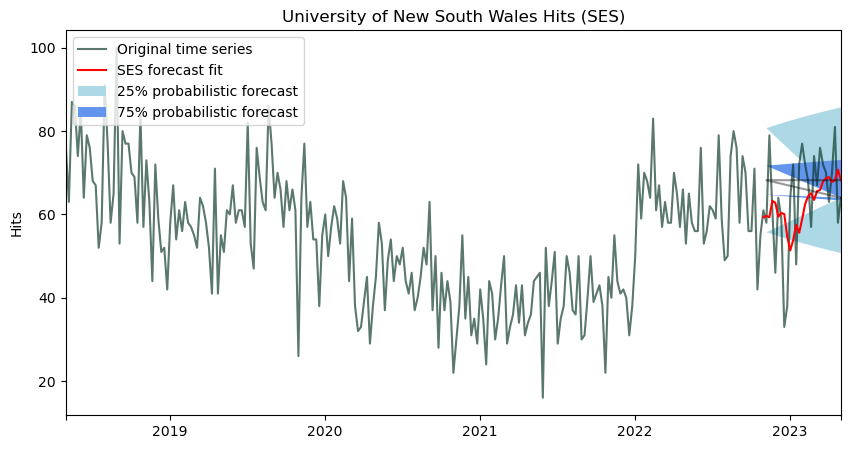

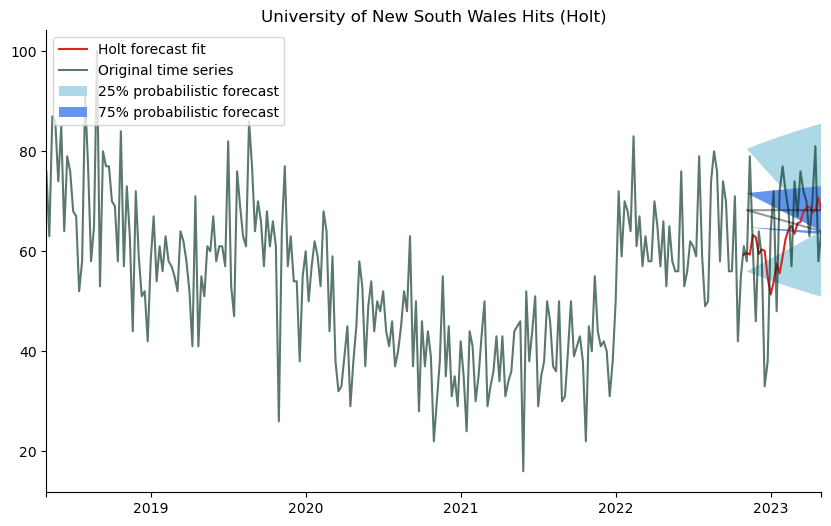

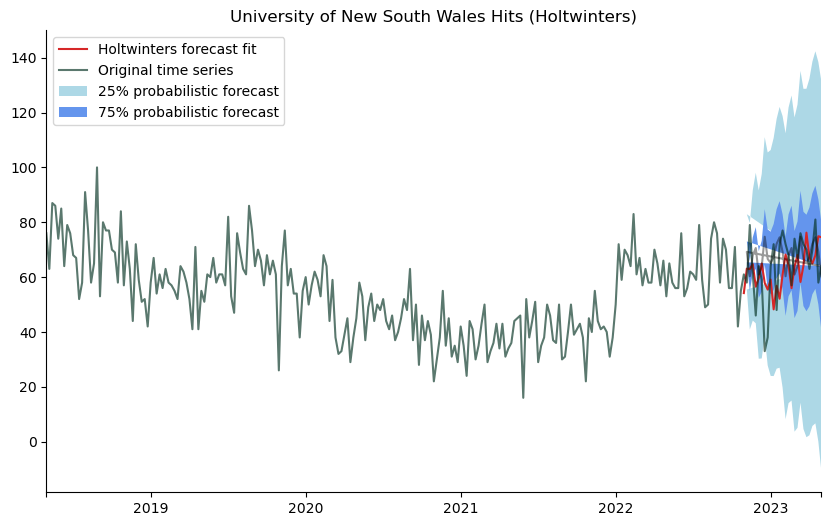

In [7]:
def exponential_smoothing(keyword, ses_performance=None, holt_performance=None, holtwinters_performance=None):
    
    y = data[data['keyword'] == keyword]['hits'].copy()
    freq = get_freq(y)
    h = get_seasonal_period(freq)
    y.index = y.index.to_period(freq=freq)
    ts = data[data['keyword'] == keyword]['hits'].copy()
    
#     ses
    ses, fitted = ses_summary(y)
    ses_diagnostics(y, fitted)
    get_decomposition(ts, h, keyword)
    validation, test = ses_validation(y)
    ax = original_vs_ses(y, fitted, keyword)
    ses_forecast(len(test), ses, y, freq, ax)
    plt.show()
    if ses_performance is not None:
        ses_performance[keyword] = [ses_mae(y, validation), ses_mae(y, test)]

#     holt
    holt, smoothed = holt_summary(ts, y)
    ax = original_vs_holt(ts, smoothed, keyword)
    holt_forecast(len(ts)//10, holt, y, freq, ax)
    plt.show()
    validation, test = holt_validation(y)
    if holt_performance is not None:
        holt_performance[keyword] = [holt_mae(y, validation), holt_mae(y, test)]
    
#     holtwinters
    models = get_models(y, h)
    validation, test = holtwinters_validation(y)
    best_model = holtwinters_best_model(y, validation, models)
    ax = original_vs_holtwinters(ts, pd.Series(best_model.smooth(), index=y.index), keyword)
    holtwinters_forecast(len(ts)//10, best_model, y, freq, ax)
    plt.show()
    if holtwinters_performance is not None:    
        holtwinters_performance[keyword] = [holtwinters_mae(y, validation, best_model), holtwinters_mae(y, test, best_model)]
    
ses_performance = {}
holt_performance = {}
holtwinters_performance = {}

for keyword in data['keyword'].unique():    
    exponential_smoothing(keyword, ses_performance, holt_performance, holtwinters_performance)
    


# Automatic ARIMA method

This below code chunk defines several functions related to forecasting time series data using the ARIMA method.

The get_arima_models function takes a time series y and a seasonal period h as arguments and returns a list of fitted ARIMA models. The function uses the auto_arima function from the pmdarima library to automatically select the best ARIMA model for the data. The function tries to fit two different ARIMA models: one with the original data and one with the log-transformed data. If a model fails to fit, it is not added to the list of models.

The arima_validation function takes a time series y as an argument and returns a validation set and test set. The validation set consists of all data up to the start of the last 10% of the data, while the test set consists of the last 10% of the data.

The arima_best_model function takes test data, a test set, and a list of models as arguments and returns the best model based on its mean absolute error (MAE) on the test set. The function iterates over the provided models and generates forecasts for each model using the predict method. The MAE is then calculated for each model using these forecasts and the actual values in the test set. The model with the lowest MAE is returned as the best model.

The arima_mae function takes test data, a test set, and a best model as arguments and returns the mean absolute error (MAE) of the provided model on the test set. The function generates forecasts for the provided model using its predict method. The MAE is then calculated using these forecasts and the actual values in the test set.

The original_vs_arima function takes several arguments including a time series ts, an ARIMA forecast pred, and a keyword. The function creates a plot that shows the original time series and the provided ARIMA forecast.

The arima_forecast function takes several arguments including a forecast horizon h, an ARIMA model, a time series y, its frequency freq, an axis object ax, and a keyword. The function generates an ARIMA forecast for the given horizon using the provided model and plots it on the provided axis object along with probabilistic forecasts based on different confidence levels.

The arima function takes a keyword and an optional performance dictionary as arguments. The function extracts two time series of hits for the given keyword from a global DataFrame named data. One of these time series is converted to have its index as periods using its frequency inferred by calling previously defined functions. A validation set is created by calling previously defined functions. A list of ARIMA models is created by calling previously defined functions. The best model among these models is determined by calling previously defined functions. A plot is created by calling previously defined functions. A forecast is plotted by calling previously defined functions. If an ARIMA performance dictionary is provided, it is updated with MAE values calculated by calling previously defined functions.

Finally, an empty performance dictionary for ARIMA method is created. The code then iterates over all unique keywords in the global DataFrame named data and calls the arima function for each keyword to update this performance dictionary.

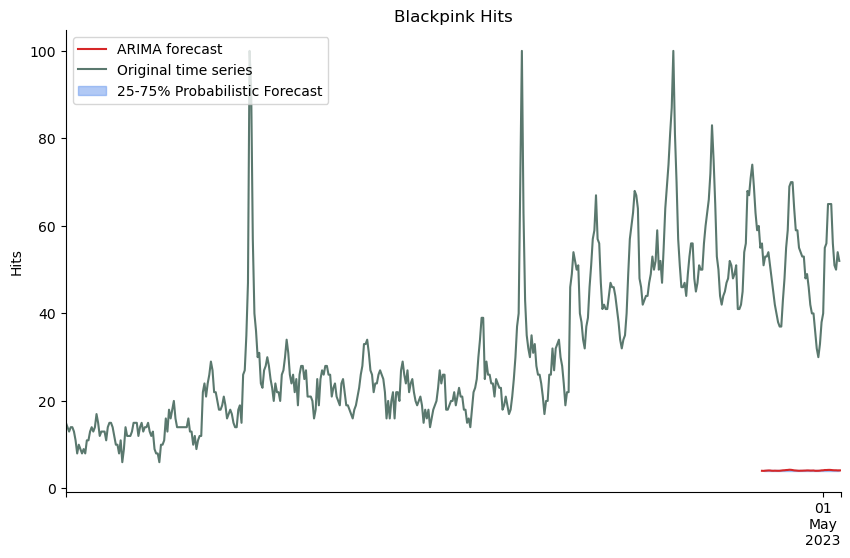

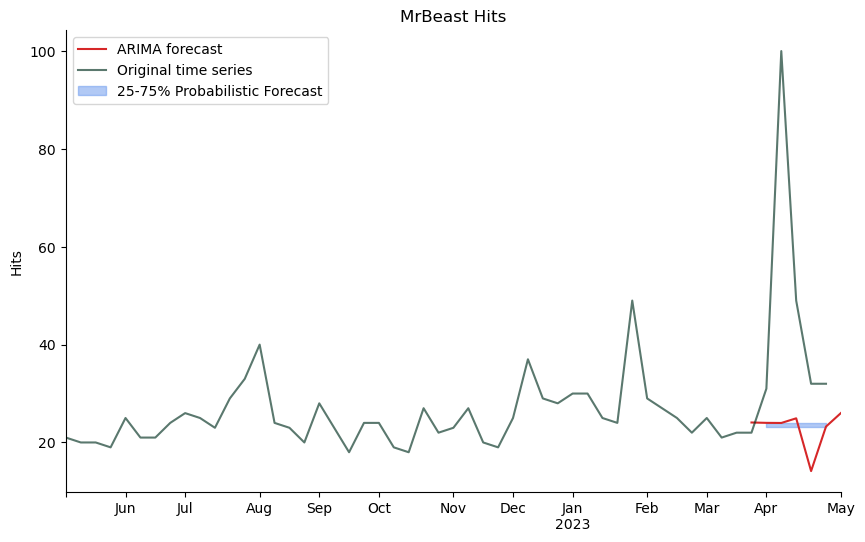

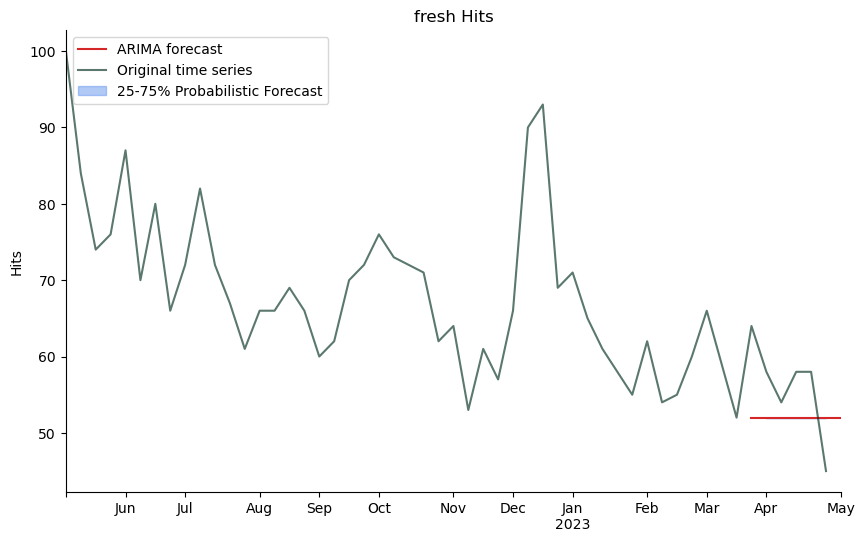

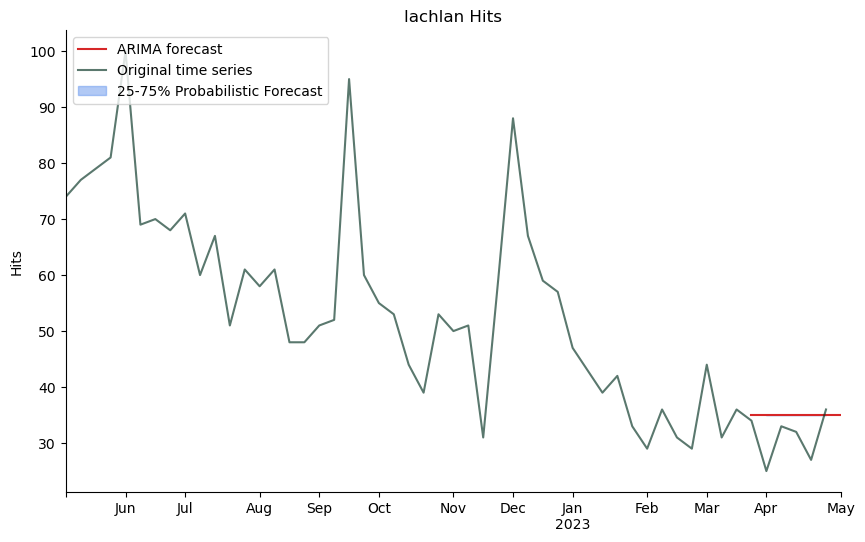

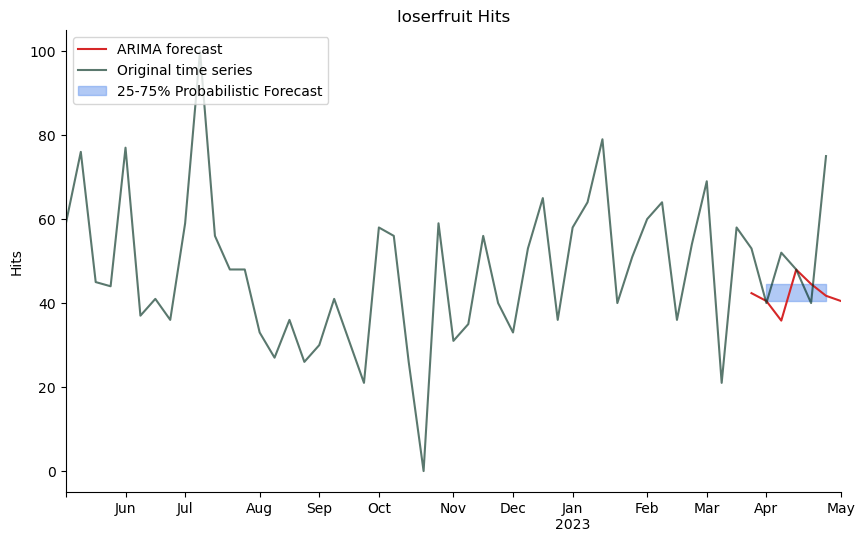

...

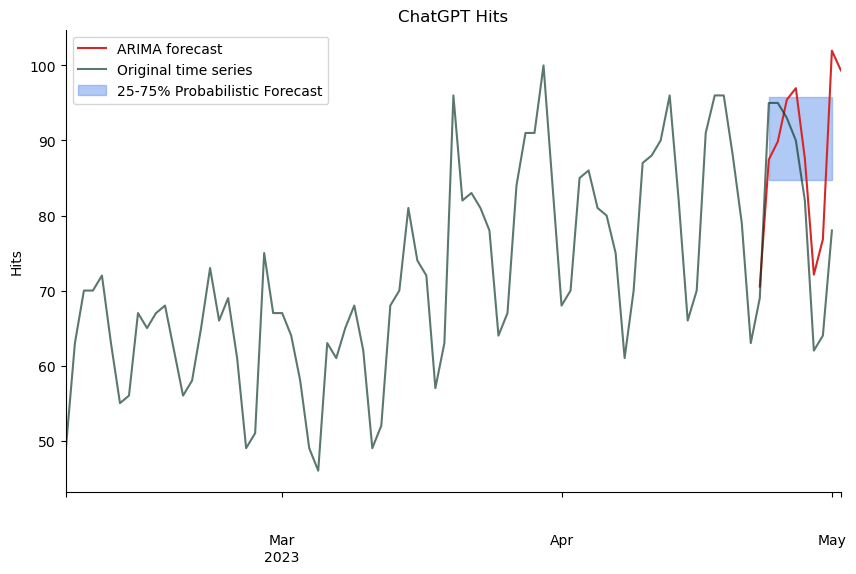

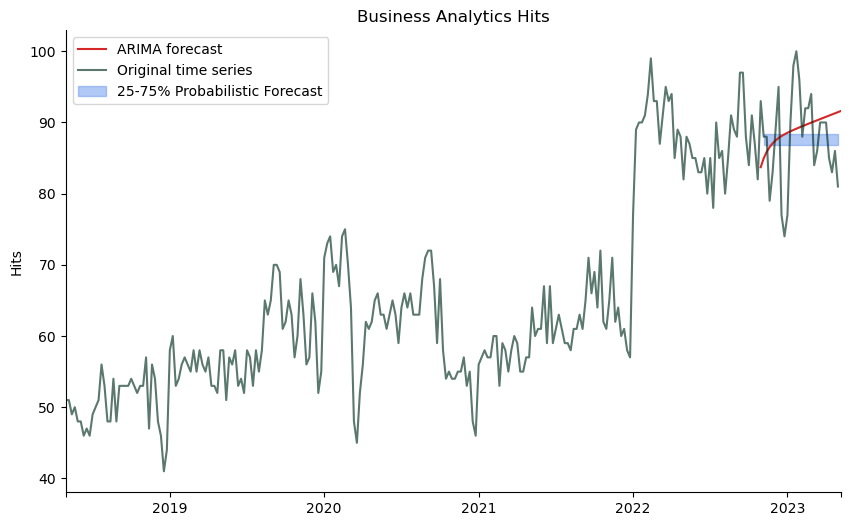

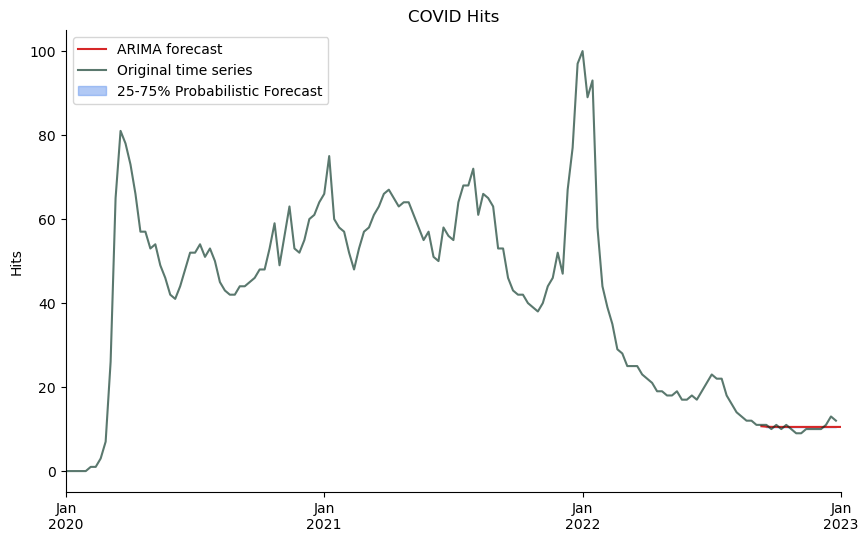

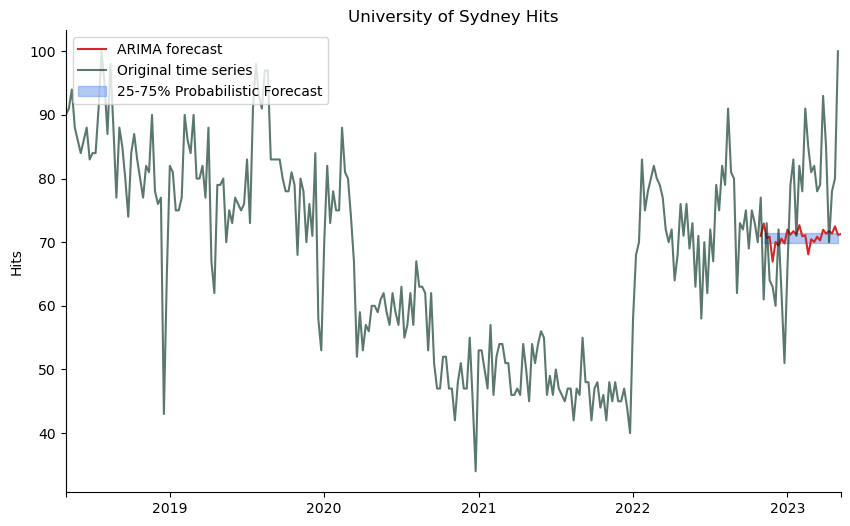

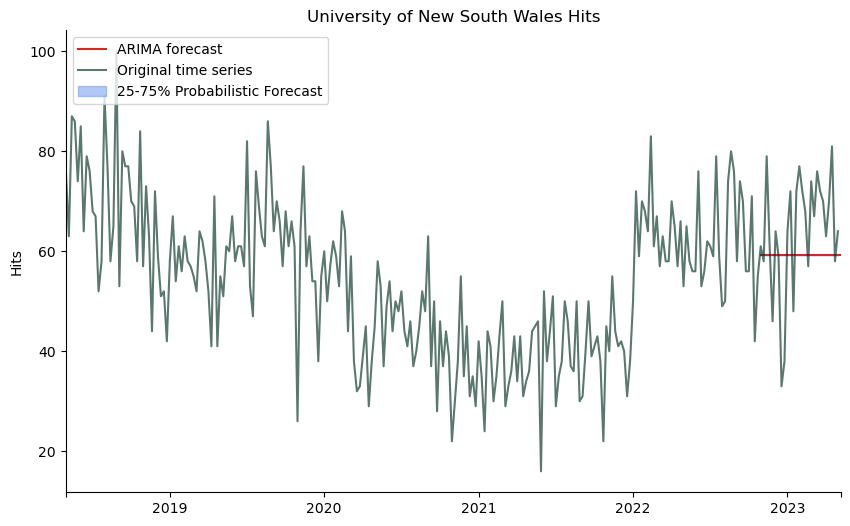

In [8]:
def get_arima_models(y, h):
    models = []
    try:
        model1 = pm.auto_arima(y, seasonal=True, m=h)
        models.append(model1)
    except:
        pass
    try:
        model2 = pm.auto_arima(np.log(y), seasonal=True, m=h)
        models.append(model2)
    except:
        pass
    return models


def arima_validation(y):
    train = y.head(-len(y)//10).index[-1]
    validation = y[:train]
    test = y[train:]
    return validation, test

def arima_best_model(test_data, test_set, models):
    best_mae = float('inf')
    best_model = None
    
    for model in models:
        arima_pred = []
        actual = []
        
        for i in range(0, len(test_set)):
            actual.append(test_data.iloc[i]) # actual value
            arima_pred.append(model.predict(1)[0]) # arima forecast

        columns=['ARIMA', 'Actual']
        results = np.vstack([arima_pred,actual]).T
        results = pd.DataFrame(results, columns=columns, index=test_set)
        try:
            mae = round(mean_absolute_error(results['Actual'], results['ARIMA']), 4)
        except (ValueError, ZeroDivisionError):
            mae = 99999
        
        if mae < best_mae:
            best_mae = mae
            best_model = model
    
    return best_model

def arima_mae(test_data, test_set, best_model):
    
    arima_pred = []
    actual = []
    
    for i in range(0, len(test_set)):
        actual.append(test_data.iloc[i]) # actual value
        arima_pred.append(best_model.predict(1)[0]) # arima forecast
    
    columns=['ARIMA', 'Actual']
    results = np.vstack([arima_pred,actual]).T
    results = pd.DataFrame(results, columns=columns, index=test_set)
    mae = round(mean_absolute_error(results['Actual'], results['ARIMA']), 4)
    
    return mae

def original_vs_arima(ts, pred, keyword):
    fig, ax= plt.subplots(figsize=(10,6))
    pred.plot(color='#D62728', label='ARIMA forecast')
    ts.plot(color='#023020', label='Original time series', alpha=0.65)
    plt.legend(loc='best')
    ax.set_xlabel('')
    ax.set_xticks([], minor=True)
    ax.set_title(keyword + ' Hits (ARIMA)')
    sns.despine()
    return ax

def arima_forecast(h, model, y, freq, ax, keyword):
    
    model = model
    test = y.tail(len(y)//10).index
    pred = pd.Series(model.predict(h), index=test)

    upper = pred.quantile(0.75)
    lower = pred.quantile(0.25)
    
    ax.fill_between(pred.index, upper, lower, color='#6495ED', alpha=0.5, label='25-75% Probabilistic Forecast')
    
    plt.legend(loc='upper left')
    ax.set_xlabel('')
    ax.set_ylabel('Hits')
    ax.set_title(keyword + ' Hits')
    ax.set_xticks([], minor=True)
    sns.despine()
    plt.show()

def arima(keyword, arima_performance=None):
    
    y = data[data['keyword'] == keyword]['hits'].copy()
    freq = get_freq(y)
    h = get_seasonal_period(freq)
    y.index = y.index.to_period(freq=freq)
    ts = data[data['keyword'] == keyword]['hits'].copy()
    
    validation, test=arima_validation(y)
    models = get_arima_models(validation, h)
    best_model=arima_best_model(y, test, models)
    pred = pd.Series(best_model.predict(len(test)))
    ax = original_vs_arima(ts, pred, keyword)
    arima_forecast(h, best_model, y, freq, ax, keyword)
    plt.show()
    if arima_performance is not None:
        arima_performance[keyword] = [arima_mae(ts, validation, best_model), arima_mae(ts, test, best_model)]

arima_performance = {}
for keyword in data['keyword'].unique():
    arima(keyword, arima_performance)

# Expected and actual performance of all models on each keyword

This below code chunk prints the expected and actual performance of several time series forecasting methods: Seasonal Naive, Simple Exponential Smoothing (SES), Holt’s linear method, Holt-Winters method, and automatic ARIMA.

The code calls the get_performance_display function with different performance dictionaries as arguments to display the expected and actual performance of each method. The get_performance_display function takes a performance dictionary as an argument and returns a display of the dictionary’s contents in a DataFrame. The function creates a DataFrame from the dictionary with the keys as columns and the values as rows. The index of the DataFrame is set to [‘Expected Performance’, ‘Actual Performance’] and the DataFrame is displayed using the display function.

The performance dictionaries are assumed to have been created earlier in this code by calling functions that perform time series forecasting using different methods and calculate their mean absolute error (MAE) on validation and test sets.

In [9]:
print('\t\tExpected and Actual Performance for Seasonal Naive')
get_performance_display(seasonal_naive_performance)
print('\n\n\t\tExpected and Actual Performance for Simple Exponential Smoothing')
get_performance_display(ses_performance)
print('\n\n\t\tExpected and Actual Performance for Holt')
get_performance_display(holt_performance)
print('\n\n\t\tExpected and Actual Performance for Holtwinters')
get_performance_display(holtwinters_performance)
print('\n\n\t\tExpected and Actual Performance for automatic ARIMA')
get_performance_display(arima_performance)

		Expected and Actual Performance for Seasonal Naive


,Blackpink,MrBeast,fresh,lachlan,loserfruit,5SOS,Lazarbeam,ChatGPT,Business Analytics,COVID,University of Sydney,University of New South Wales
Expected Performance,3.5645,4.7708,7.9375,10.1042,18.7292,11.6875,10.0625,8.1646,3.6907,3.9789,5.5466,10.6271
Actual Performance,3.1667,27.6000,6.8000,6.8000,18.8000,5.2000,10.0000,8.2500,4.9231,0.8000,9.6923,12.0769




		Expected and Actual Performance for Simple Exponential Smoothing


,Blackpink,MrBeast,fresh,lachlan,loserfruit,5SOS,Lazarbeam,ChatGPT,Business Analytics,COVID,University of Sydney,University of New South Wales
Expected Performance,3.4806,3.9341,6.4203,8.3747,14.6746,10.0096,8.1745,7.725,3.3882,3.8944,4.8373,7.8709
Actual Performance,1.4526,1.2000,7.8000,5.2000,12.8000,5.0000,6.3890,5.125,1.6873,6.4000,4.2748,8.9004




		Expected and Actual Performance for Holt


,Blackpink,MrBeast,fresh,lachlan,loserfruit,5SOS,Lazarbeam,ChatGPT,Business Analytics,COVID,University of Sydney,University of New South Wales
Expected Performance,3.4562,3.8188,6.1405,8.0422,14.3009,9.3216,8.1924,7.6833,3.3837,3.7526,4.8401,7.8643
Actual Performance,1.3493,1.1008,6.5417,3.8759,12.8000,3.6054,5.3890,4.5696,1.6365,5.2010,4.1387,8.5101




		Expected and Actual Performance for Holtwinters


,Blackpink,MrBeast,fresh,lachlan,loserfruit,5SOS,Lazarbeam,ChatGPT,Business Analytics,COVID,University of Sydney,University of New South Wales
Expected Performance,26.3388,6.0751,10.6202,21.5113,15.9306,13.1288,34.4004,14.9382,21.1117,34.2587,13.8952,17.9832
Actual Performance,8.1833,8.3707,25.5990,48.2159,13.2592,20.5100,56.0170,20.6597,32.6879,27.4304,12.3975,10.2767




		Expected and Actual Performance for automatic ARIMA


,Blackpink,MrBeast,fresh,lachlan,loserfruit,5SOS,Lazarbeam,ChatGPT,Business Analytics,COVID,University of Sydney,University of New South Wales
Expected Performance,26.2851,3.9202,16.4130,21.4271,14.9904,18.7577,24.1522,10.6100,21.4965,35.4431,13.6451,12.8753
Actual Performance,8.2856,3.3447,29.5714,43.4727,13.7026,25.9022,40.4286,7.8249,32.7564,29.5101,15.2244,14.4750


# Results

### **{Disclaimer}
#### Point forecast is done using the last 10% of the data's keyword quantities. Probabilitistic forecast was done on the point forecast only since the criteria did not specify whether to go beyond the last 10% or stick with the last 10%. Expected and actual error were based on the validation sets and test sets respectively. For ARIMA modelling, I only used automatic modelling since manual process using first differencing, ACF and PACF plots, fitting and using AIC to select orders would take too long for all keywords and combinations, making it very inefficient to forecast test data due to runtime.

### Get best model for each keyword

The below code chunk defines a function named get_best_performance that takes a list of performance dictionaries as an argument and returns a dictionary that contains the best performance for each keyword.

The function iterates over the provided list of performance dictionaries and extracts the expected and actual performance values for each keyword. If a keyword is not already in the result dictionary, it is added along with its performance values and the name of the model. If a keyword is already in the result dictionary, its performance values are compared with the current best performance values. If the actual performance value is lower than the current best actual performance value, the result dictionary is updated with the new performance values and the name of the model.

The code then adds a ‘model’ key to several performance dictionaries that were assumed to have been created earlier in this code. These performance dictionaries contain the expected and actual performance of several time series forecasting methods: Seasonal Naive, Simple Exponential Smoothing (SES), Holt’s linear method, Holt-Winters method, and automatic ARIMA.

The code then creates a list of these performance dictionaries and calls the get_best_performance function with this list as an argument to get the best performance for each keyword. The result is then converted into a DataFrame using the from_dict method of the Pandas DataFrame object and transposed to have keywords as rows and performance measures as columns.

In [10]:
def get_best_performance(dicts):
    result = {}
    for d in dicts:
        for key, value in d.items():
            if key != 'model':
                if key not in result:
                    result[key] = {'model': d['model'], 'expected performance': value[0], 'actual performance': value[1]}
                else:
                    if value[1] < result[key]['actual performance']:
                        result[key] = {'model': d['model'], 'expected performance': value[0], 'actual performance': value[1]}
    return result


seasonal_naive_performance['model'] = 'Seasonal Naive'
ses_performance['model'] = 'SES'
holt_performance['model'] = 'Holt'
holtwinters_performance['model'] = 'Holt Winters'
arima_performance['model'] = 'ARIMA'

dicts = [seasonal_naive_performance, ses_performance, holt_performance, holtwinters_performance, arima_performance]
best_performance = get_best_performance(dicts)
results = pd.DataFrame.from_dict(best_performance).T
results

,model,expected performance,actual performance
Blackpink,Holt,3.4562,1.3493
MrBeast,Holt,3.8188,1.1008
fresh,Holt,6.1405,6.5417
lachlan,Holt,8.0422,3.8759
loserfruit,SES,14.6746,12.8
5SOS,Holt,9.3216,3.6054
Lazarbeam,Holt,8.1924,5.389
ChatGPT,Holt,7.6833,4.5696
Business Analytics,Holt,3.3837,1.6365
COVID,Seasonal Naive,3.9789,0.8


### Get plots for each keyword using the best model

The below code chunk iterates over the index of a DataFrame named results and prints diagnostic information, trend/seasonal graphs (if available), and forecast plots for the best model of each keyword.

The code extracts the name of the best model for each keyword from the results DataFrame and checks if it is one of several predefined model names: ‘Seasonal Naive’, ‘SES’, ‘Holt’, ‘Holt Winters’, or ‘ARIMA’. If the best model is one of these models, the corresponding function is called to generate diagnostic information, trend/seasonal graphs (if available), and forecast plots for that keyword. These functions were assumed to have been defined earlier in this code.

		'Blackpink' model diagnostics, trend/seasonal graphs (if available) and forecast plots


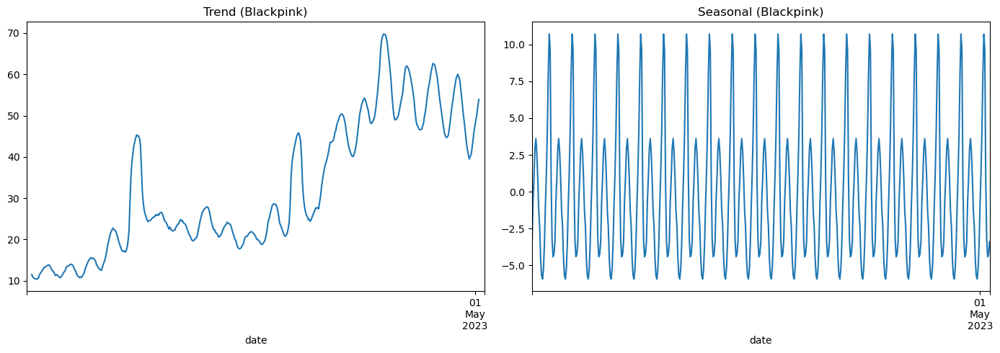

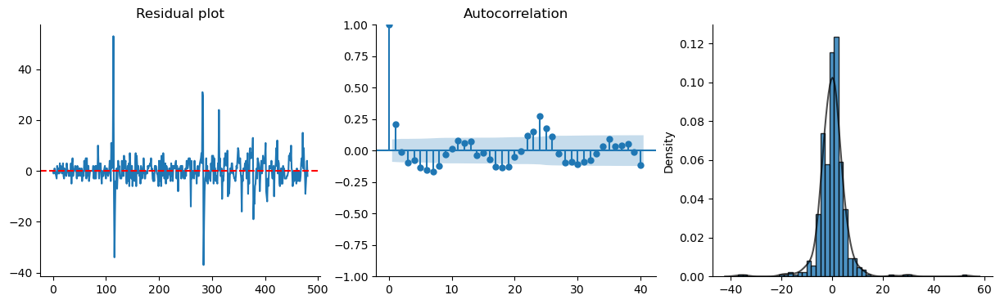

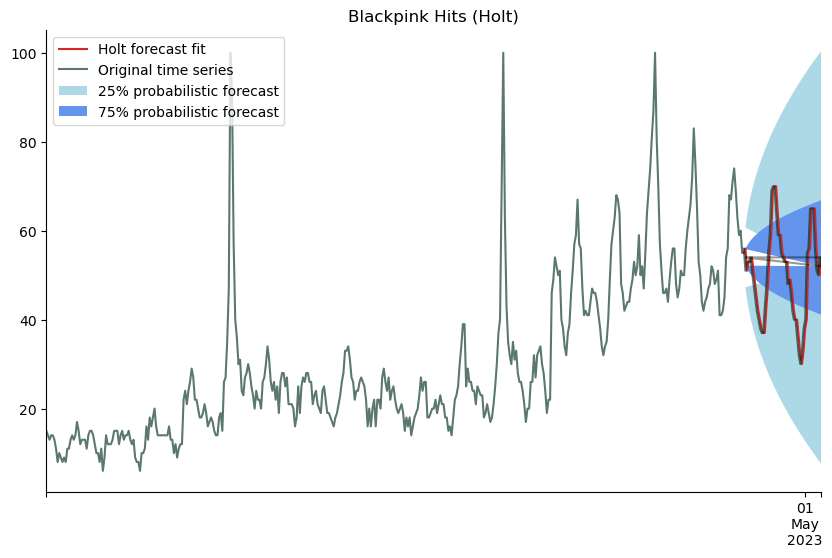



		'MrBeast' model diagnostics, trend/seasonal graphs (if available) and forecast plots


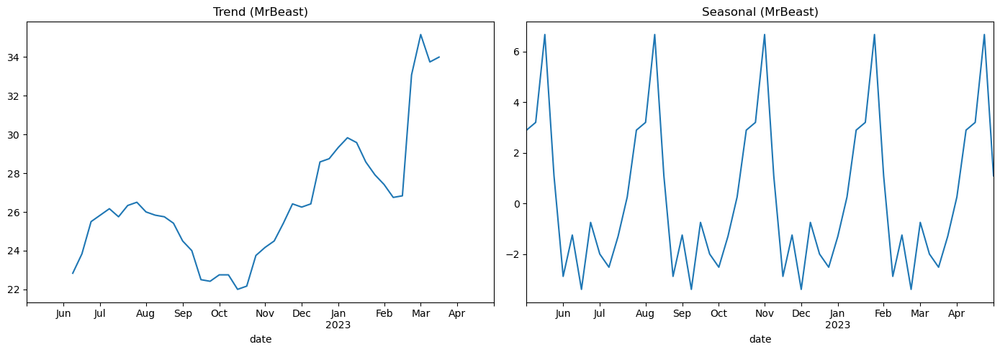

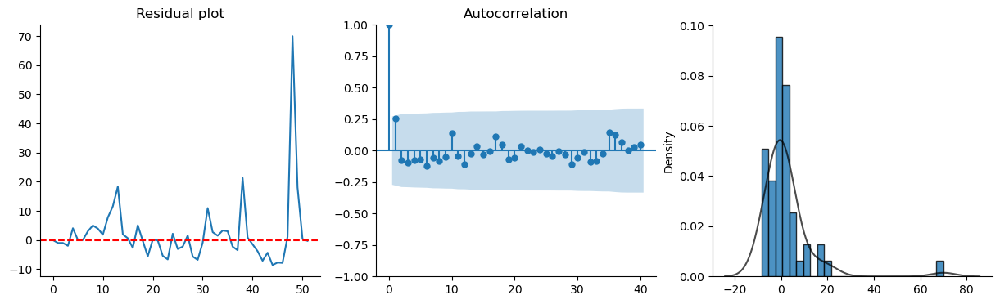

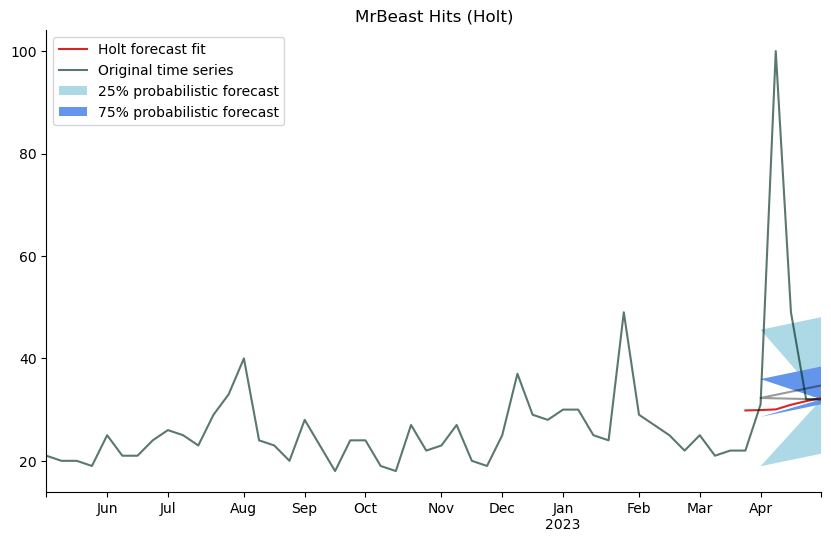



		'fresh' model diagnostics, trend/seasonal graphs (if available) and forecast plots


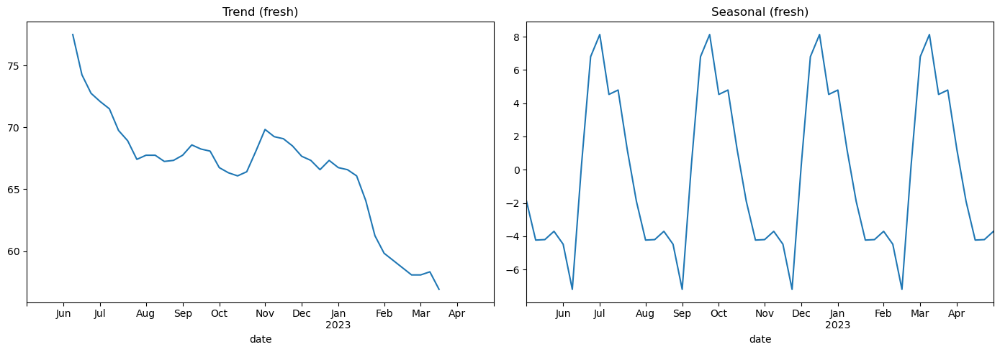

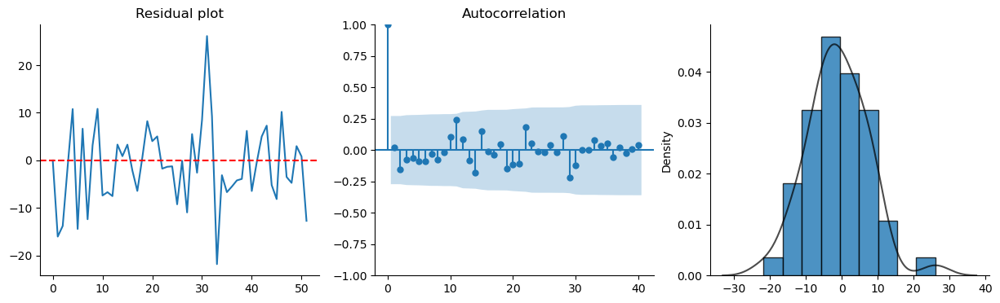

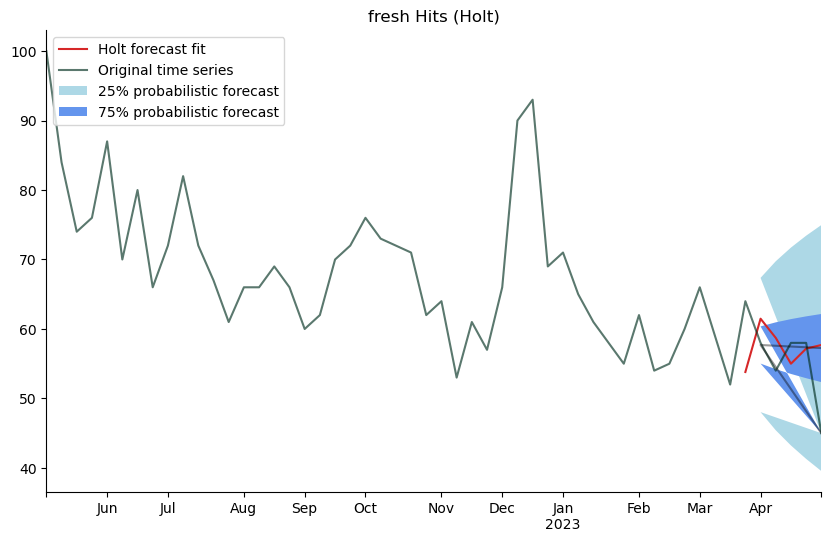



		'lachlan' model diagnostics, trend/seasonal graphs (if available) and forecast plots


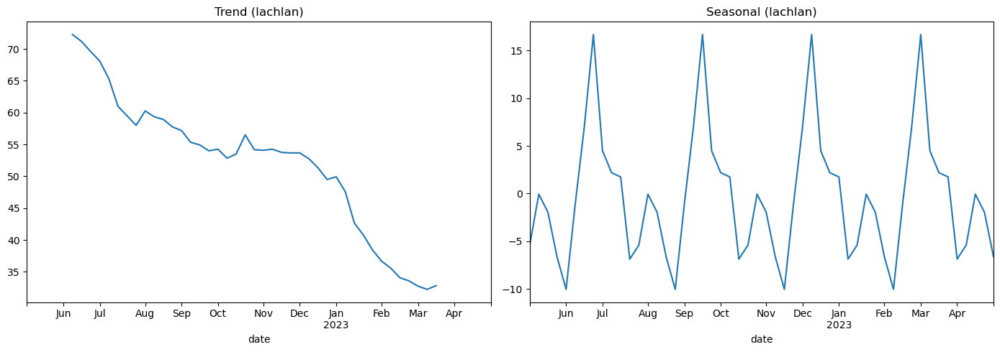

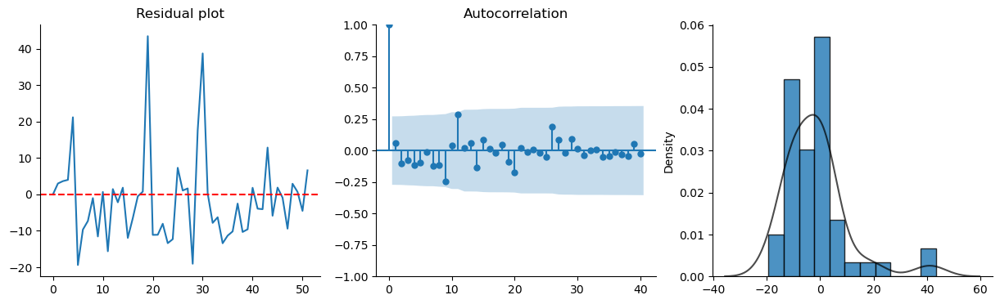

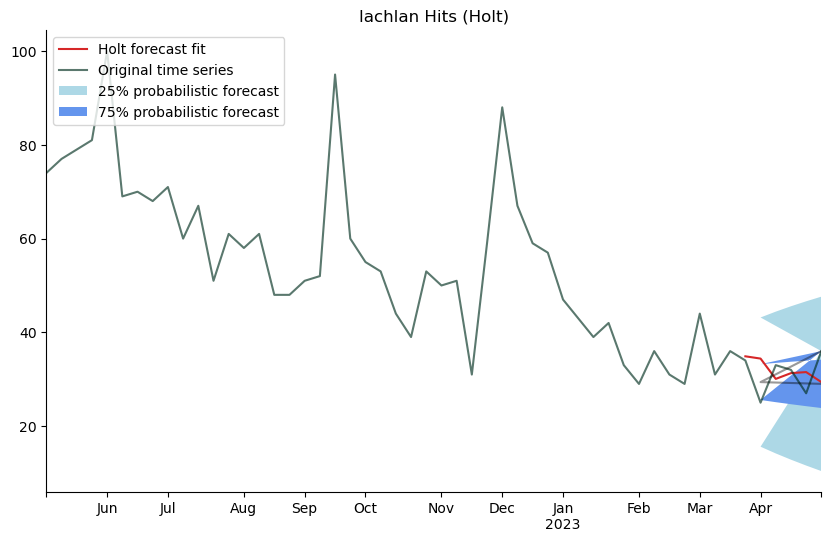



		'loserfruit' model diagnostics, trend/seasonal graphs (if available) and forecast plots


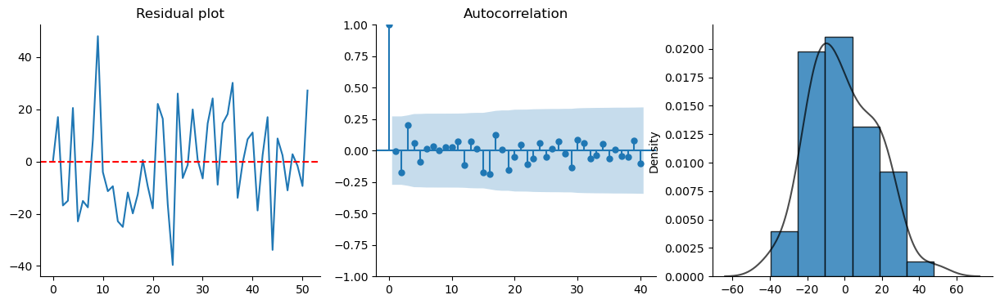

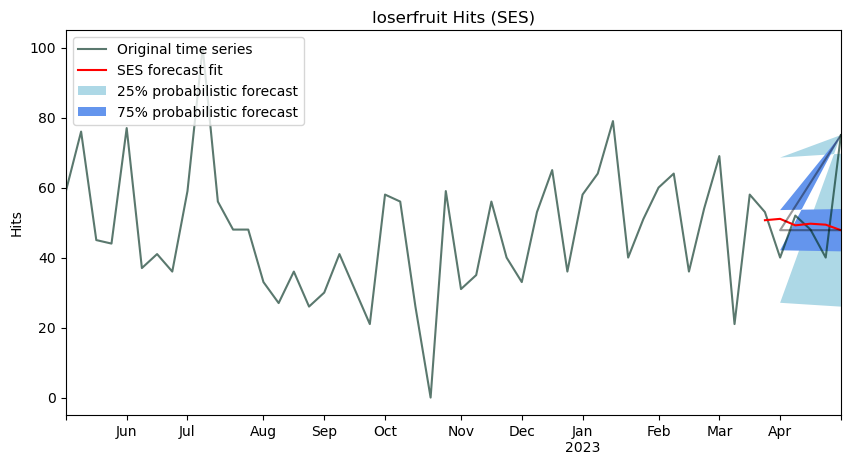



		'5SOS' model diagnostics, trend/seasonal graphs (if available) and forecast plots


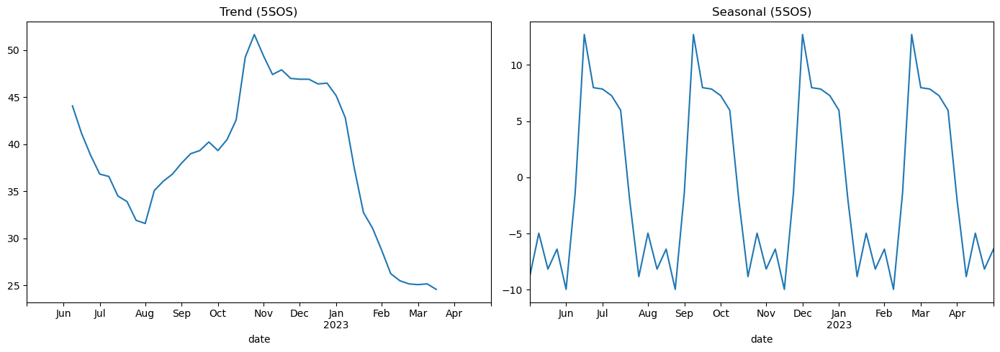

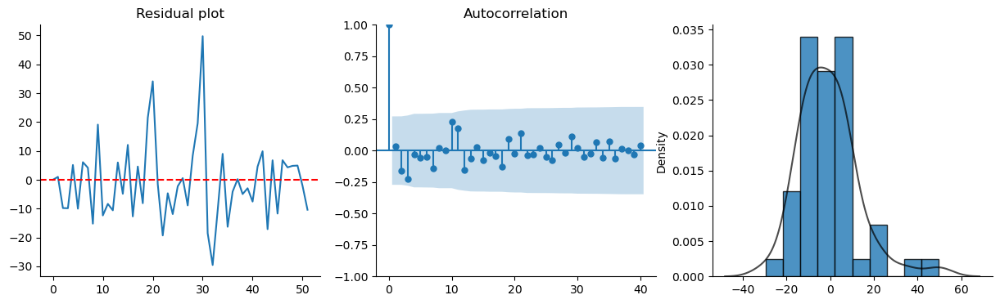

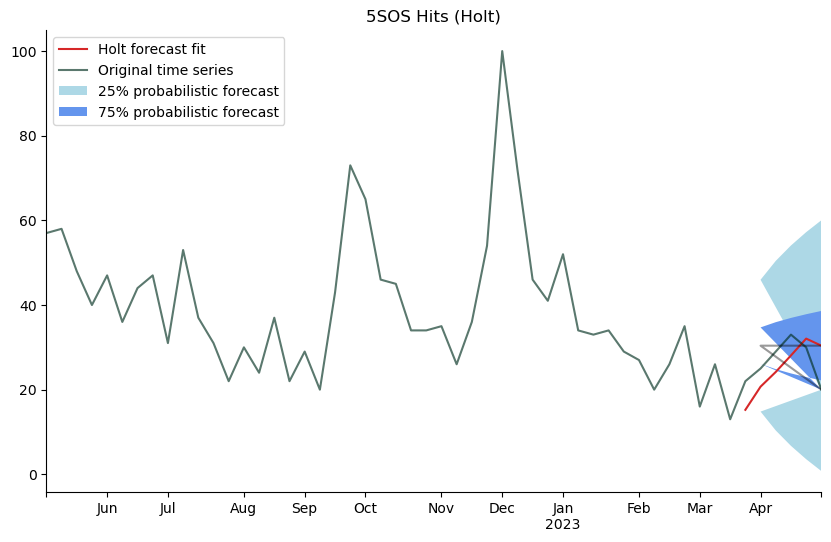



		'Lazarbeam' model diagnostics, trend/seasonal graphs (if available) and forecast plots


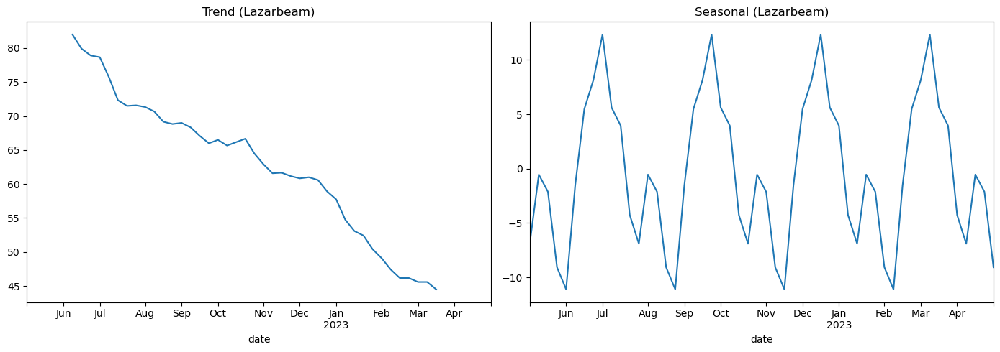

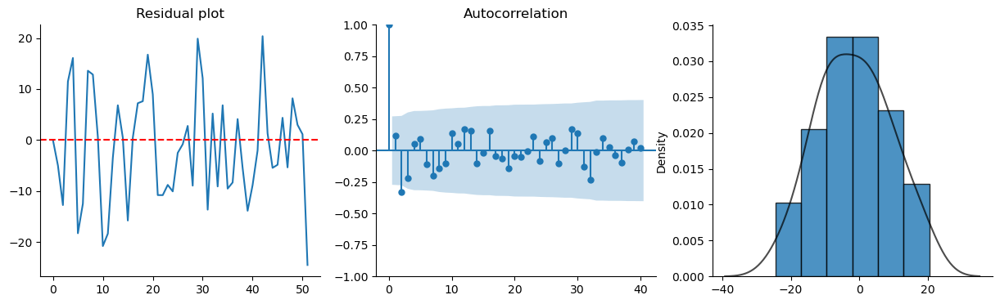

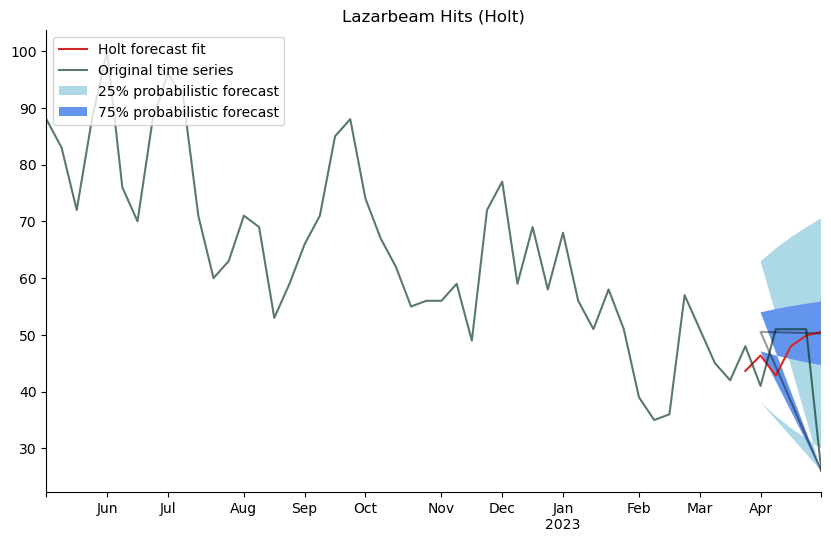



		'ChatGPT' model diagnostics, trend/seasonal graphs (if available) and forecast plots


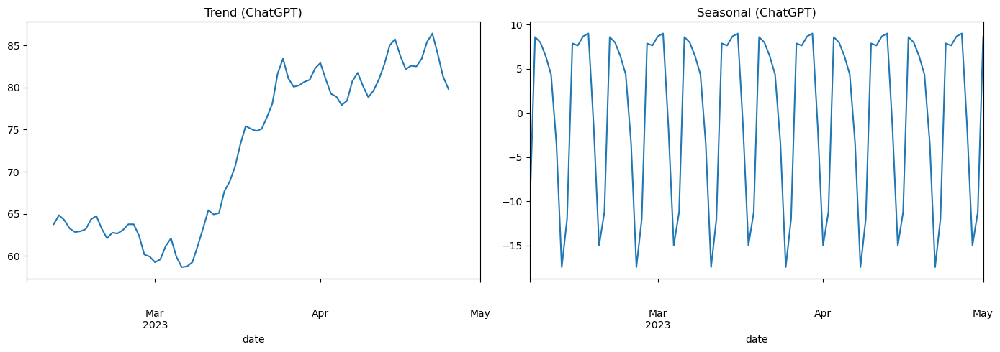

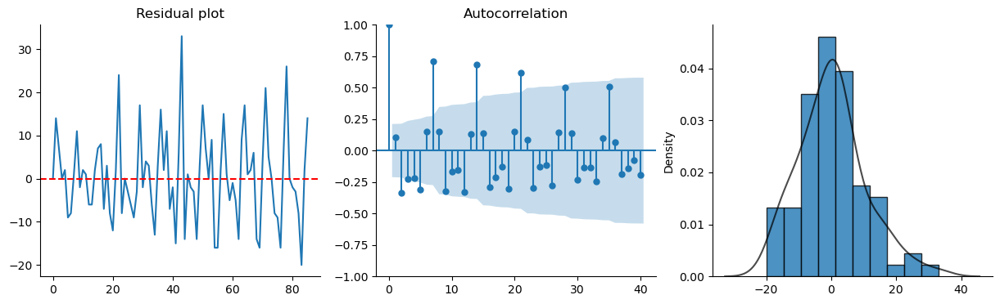

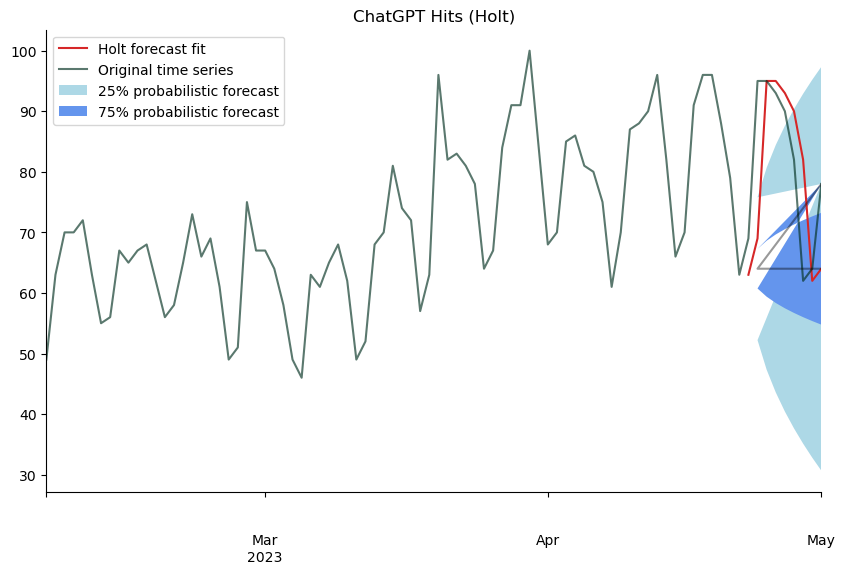



		'Business Analytics' model diagnostics, trend/seasonal graphs (if available) and forecast plots


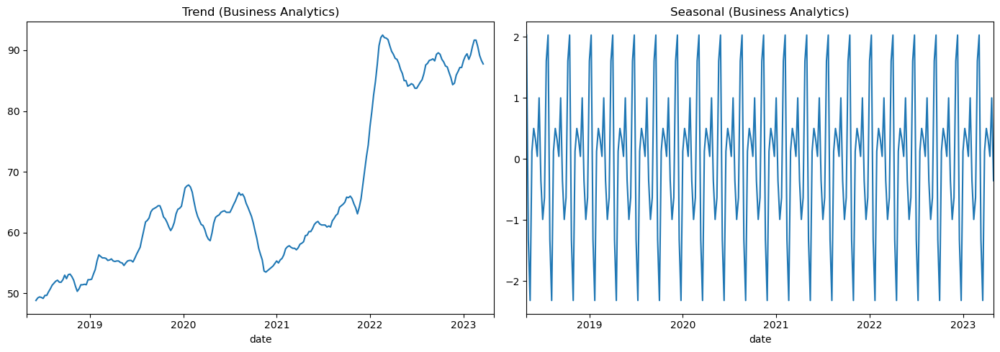

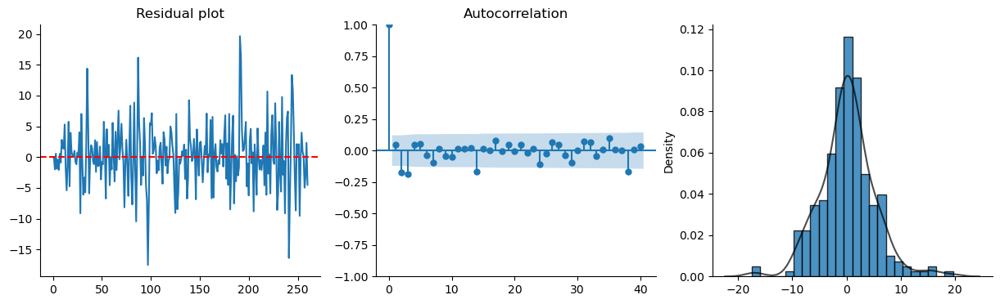

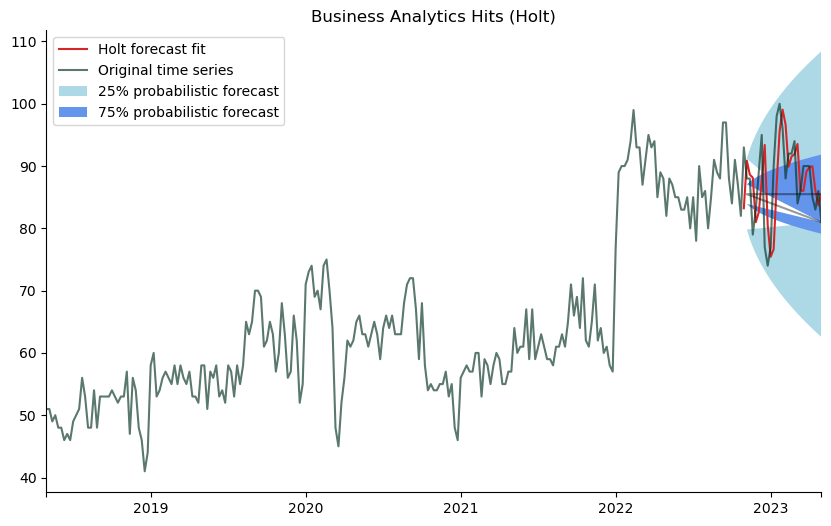



		'COVID' model diagnostics, trend/seasonal graphs (if available) and forecast plots


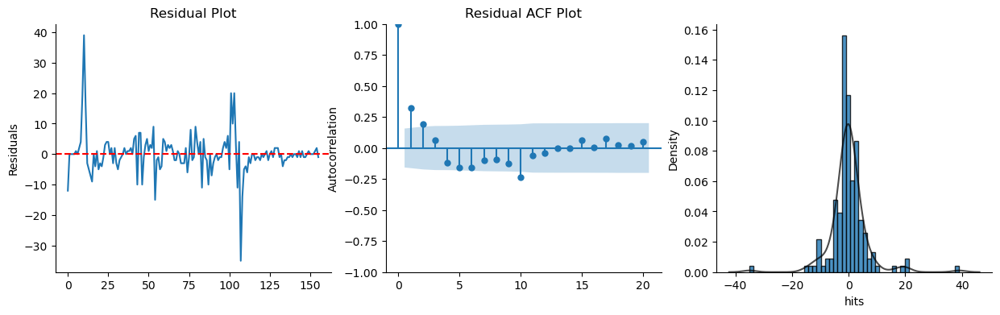

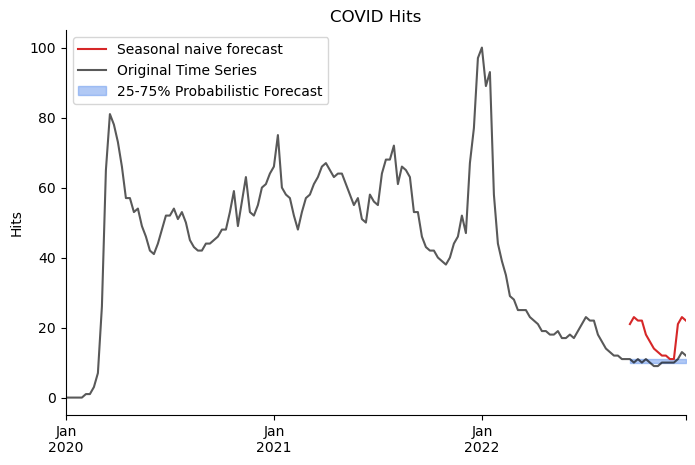



		'University of Sydney' model diagnostics, trend/seasonal graphs (if available) and forecast plots


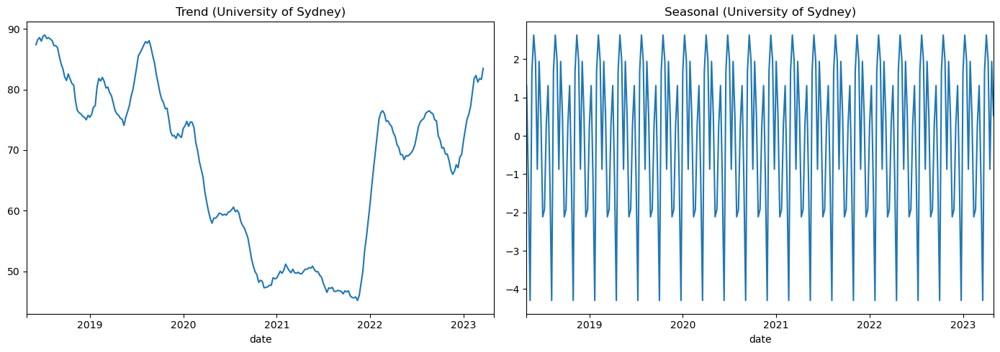

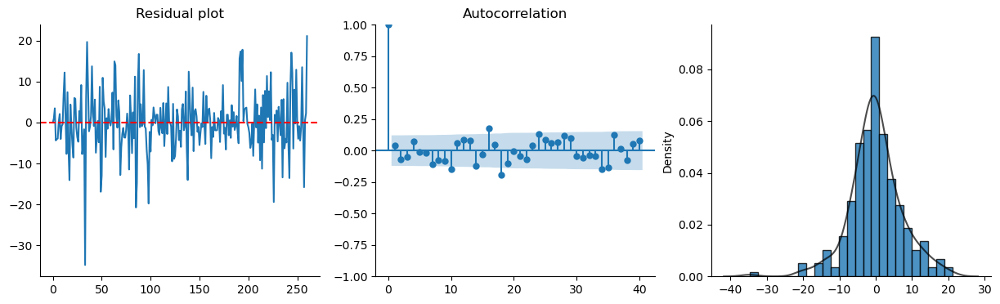

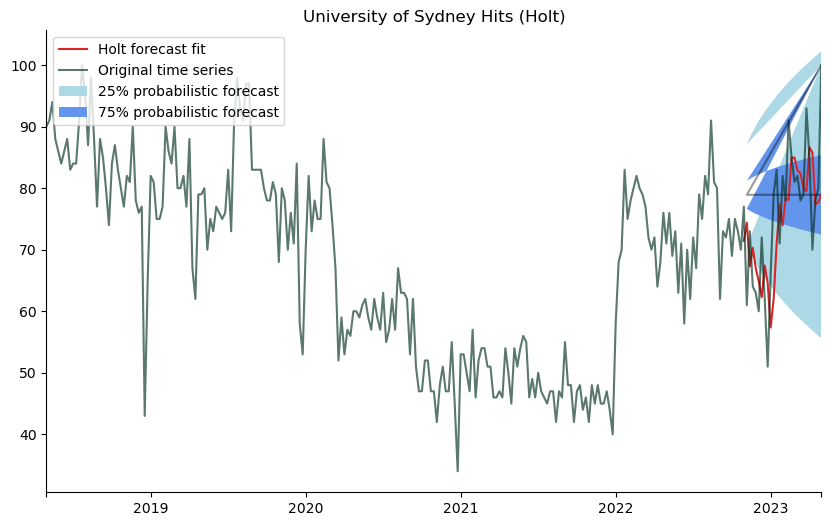



		'University of New South Wales' model diagnostics, trend/seasonal graphs (if available) and forecast plots


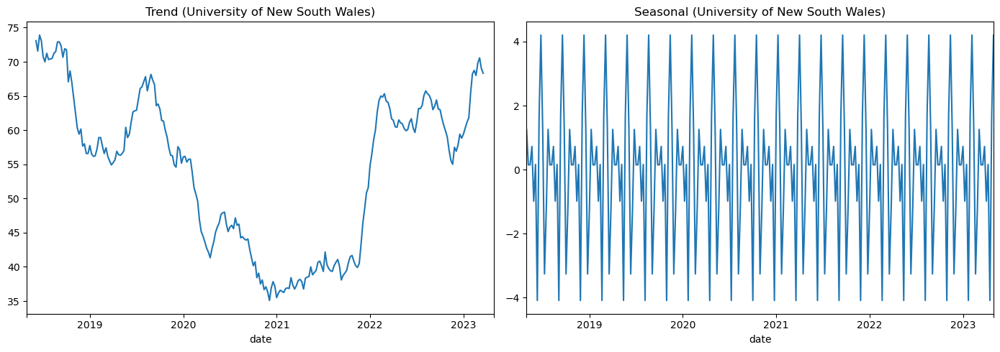

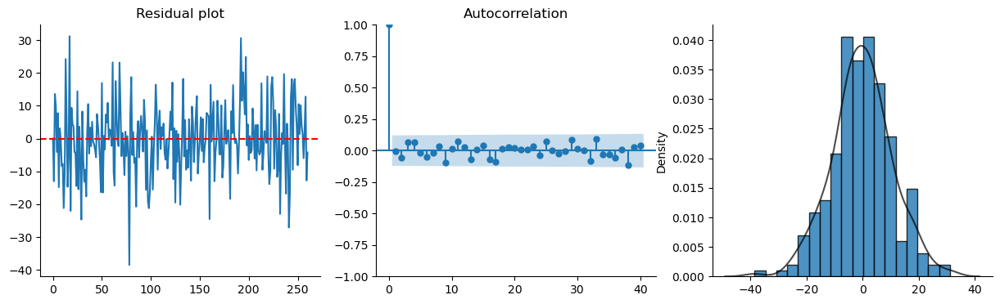

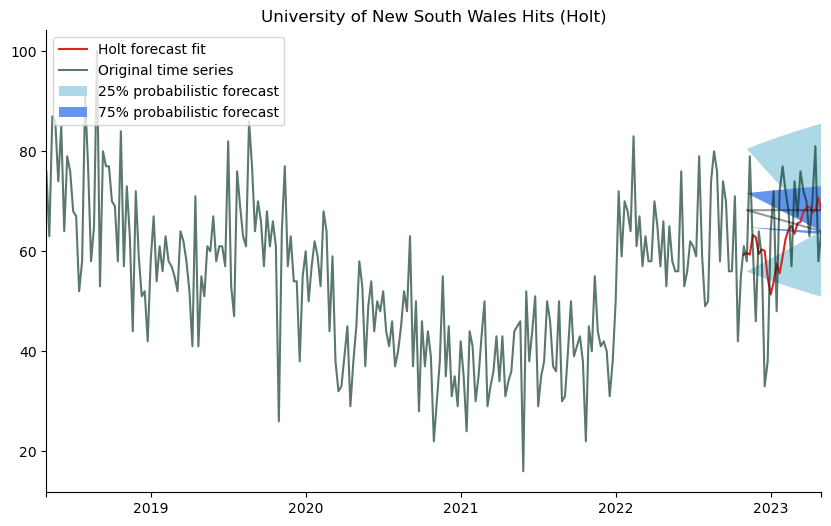

In [11]:
for keyword in results.index:
    
    print('\t\t\'' + keyword + '\' model diagnostics, trend/seasonal graphs (if available) and forecast plots')
    
    model_name = results[results.index == keyword]['model'][0]
    if model_name == 'Seasonal Naive':
        seasonal_naive(keyword)
    elif model_name == 'SES':
        ses(keyword)
    elif model_name == 'Holt':
        holt(keyword)
    elif model_name == 'Holt Winters':
        holtwinters(keyword)
    elif model_name == 'ARIMA':
        arima(keyword)
    
    print('\n')

### Final remarks on the results

We can see that most of the best performing models for each keyword is the Holt method. From this we can see that, from this dataset, there seems to be an underlying trend but no clear seasonality as the Holtwinters method has a higher MAE than the Holt method. Similarly, for the ARIMA model, there seems to be higher error when accounting for seasonality.